In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=0.2 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 2.000e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 34716 
    Total predicted counts          : 34832.08
    Total off counts                : 101169.00

    Total background counts         : 20233.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 1min 5s, sys: 743 ms, total: 1min 6s
Wall time: 1min 21s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 35056 
    Total predicted counts          : 35011.28
    Total off counts                : 102065.00

    Total background counts         : 20413.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 34660 
    Total predicted counts          : 34896.08
    Total off counts                : 101489.00

    Total background counts         : 2

SpectrumDatasetOnOff

    Name                            : obs_11 

    Total counts                    : 34895 
    Total predicted counts          : 34899.28
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_12 

    Total counts                    : 34910 
    Total predicted counts          : 34967.48
    Total off counts                : 101846.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_25 

    Total counts                    : 35107 
    Total predicted counts          : 34962.68
    Total off counts                : 101822.00

    Total background counts         : 20364.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_26 

    Total counts                    : 35163 
    Total predicted counts          : 34851.28
    Total off counts                : 101265.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_40 

    Total counts                    : 35143 
    Total predicted counts          : 34976.88
    Total off counts                : 101893.00

    Total background counts         : 20378.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_41 

    Total counts                    : 34754 
    Total predicted counts          : 34837.08
    Total off counts                : 101194.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_54 

    Total counts                    : 34704 
    Total predicted counts          : 34875.68
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_55 

    Total counts                    : 34951 
    Total predicted counts          : 34917.08
    Total off counts                : 101594.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_67 

    Total counts                    : 34976 
    Total predicted counts          : 35066.48
    Total off counts                : 102341.00

    Total background counts         : 20468.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_68 

    Total counts                    : 34979 
    Total predicted counts          : 34814.48
    Total off counts                : 101081.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_79 

    Total counts                    : 34981 
    Total predicted counts          : 34859.28
    Total off counts                : 101305.00

    Total background counts         : 20261.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_80 

    Total counts                    : 34899 
    Total predicted counts          : 34941.28
    Total off counts                : 101715.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_91 

    Total counts                    : 34890 
    Total predicted counts          : 34994.08
    Total off counts                : 101979.00

    Total background counts         : 20395.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_92 

    Total counts                    : 34997 
    Total predicted counts          : 34851.08
    Total off counts                : 101264.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_104 

    Total counts                    : 34697 
    Total predicted counts          : 35004.48
    Total off counts                : 102031.00

    Total background counts         : 20406.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_105 

    Total counts                    : 34780 
    Total predicted counts          : 34974.68
    Total off counts                : 101882.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_118 

    Total counts                    : 35083 
    Total predicted counts          : 35012.68
    Total off counts                : 102072.00

    Total background counts         : 20414.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_119 

    Total counts                    : 34942 
    Total predicted counts          : 34812.88
    Total off counts                : 101073.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_132 

    Total counts                    : 34988 
    Total predicted counts          : 34881.48
    Total off counts                : 101416.00

    Total background counts         : 20283.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_133 

    Total counts                    : 34704 
    Total predicted counts          : 34926.08
    Total off counts                : 101639.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_143 

    Total counts                    : 34563 
    Total predicted counts          : 34911.48
    Total off counts                : 101566.00

    Total background counts         : 20313.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_144 

    Total counts                    : 34918 
    Total predicted counts          : 34975.88
    Total off counts                : 101888.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_155 

    Total counts                    : 34620 
    Total predicted counts          : 34844.08
    Total off counts                : 101229.00

    Total background counts         : 20245.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_156 

    Total counts                    : 34604 
    Total predicted counts          : 35017.48
    Total off counts                : 102096.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_167 

    Total counts                    : 35055 
    Total predicted counts          : 34940.08
    Total off counts                : 101709.00

    Total background counts         : 20341.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_168 

    Total counts                    : 35177 
    Total predicted counts          : 34902.28
    Total off counts                : 101520.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_179 

    Total counts                    : 35027 
    Total predicted counts          : 34923.28
    Total off counts                : 101625.00

    Total background counts         : 20325.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_180 

    Total counts                    : 34902 
    Total predicted counts          : 34934.88
    Total off counts                : 101683.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_191 

    Total counts                    : 34797 
    Total predicted counts          : 34876.08
    Total off counts                : 101389.00

    Total background counts         : 20277.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_192 

    Total counts                    : 34706 
    Total predicted counts          : 34948.88
    Total off counts                : 101753.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_203 

    Total counts                    : 35101 
    Total predicted counts          : 34961.28
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_204 

    Total counts                    : 35180 
    Total predicted counts          : 34957.28
    Total off counts                : 101795.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_216 

    Total counts                    : 34842 
    Total predicted counts          : 34961.08
    Total off counts                : 101814.00

    Total background counts         : 20362.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_217 

    Total counts                    : 34931 
    Total predicted counts          : 34902.88
    Total off counts                : 101523.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_229 

    Total counts                    : 34971 
    Total predicted counts          : 34991.68
    Total off counts                : 101967.00

    Total background counts         : 20393.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_230 

    Total counts                    : 35089 
    Total predicted counts          : 34858.28
    Total off counts                : 101300.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_242 

    Total counts                    : 34925 
    Total predicted counts          : 34783.08
    Total off counts                : 100924.00

    Total background counts         : 20184.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_243 

    Total counts                    : 34735 
    Total predicted counts          : 34984.88
    Total off counts                : 101933.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_255 

    Total counts                    : 34742 
    Total predicted counts          : 34854.28
    Total off counts                : 101280.00

    Total background counts         : 20256.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_256 

    Total counts                    : 34842 
    Total predicted counts          : 35052.68
    Total off counts                : 102272.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_270 

    Total counts                    : 34888 
    Total predicted counts          : 34816.08
    Total off counts                : 101089.00

    Total background counts         : 20217.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_271 

    Total counts                    : 34860 
    Total predicted counts          : 35004.48
    Total off counts                : 102031.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_283 

    Total counts                    : 35139 
    Total predicted counts          : 34907.88
    Total off counts                : 101548.00

    Total background counts         : 20309.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_284 

    Total counts                    : 34555 
    Total predicted counts          : 34868.28
    Total off counts                : 101350.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_297 

    Total counts                    : 35089 
    Total predicted counts          : 34892.28
    Total off counts                : 101470.00

    Total background counts         : 20294.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_298 

    Total counts                    : 35016 
    Total predicted counts          : 34754.68
    Total off counts                : 100782.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_310 

    Total counts                    : 34951 
    Total predicted counts          : 34924.28
    Total off counts                : 101630.00

    Total background counts         : 20326.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_311 

    Total counts                    : 34644 
    Total predicted counts          : 34919.28
    Total off counts                : 101605.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_325 

    Total counts                    : 35138 
    Total predicted counts          : 34873.68
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_326 

    Total counts                    : 34811 
    Total predicted counts          : 34939.48
    Total off counts                : 101706.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_338 

    Total counts                    : 34450 
    Total predicted counts          : 34929.08
    Total off counts                : 101654.00

    Total background counts         : 20330.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_339 

    Total counts                    : 34706 
    Total predicted counts          : 34815.48
    Total off counts                : 101086.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_352 

    Total counts                    : 35022 
    Total predicted counts          : 34798.28
    Total off counts                : 101000.00

    Total background counts         : 20200.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_353 

    Total counts                    : 34699 
    Total predicted counts          : 35042.08
    Total off counts                : 102219.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_364 

    Total counts                    : 34877 
    Total predicted counts          : 34882.28
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_365 

    Total counts                    : 35229 
    Total predicted counts          : 34937.08
    Total off counts                : 101694.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_378 

    Total counts                    : 35082 
    Total predicted counts          : 34892.88
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_379 

    Total counts                    : 34959 
    Total predicted counts          : 34885.48
    Total off counts                : 101436.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_389 

    Total counts                    : 34710 
    Total predicted counts          : 34883.28
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_390 

    Total counts                    : 34863 
    Total predicted counts          : 34856.08
    Total off counts                : 101289.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_400 

    Total counts                    : 35070 
    Total predicted counts          : 34956.48
    Total off counts                : 101791.00

    Total background counts         : 20358.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_401 

    Total counts                    : 34871 
    Total predicted counts          : 34908.28
    Total off counts                : 101550.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_413 

    Total counts                    : 34877 
    Total predicted counts          : 34966.68
    Total off counts                : 101842.00

    Total background counts         : 20368.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_414 

    Total counts                    : 35038 
    Total predicted counts          : 34863.48
    Total off counts                : 101326.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_426 

    Total counts                    : 35298 
    Total predicted counts          : 34871.28
    Total off counts                : 101365.00

    Total background counts         : 20273.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_427 

    Total counts                    : 34972 
    Total predicted counts          : 34934.28
    Total off counts                : 101680.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_440 

    Total counts                    : 34646 
    Total predicted counts          : 34864.28
    Total off counts                : 101330.00

    Total background counts         : 20266.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_441 

    Total counts                    : 34723 
    Total predicted counts          : 34808.88
    Total off counts                : 101053.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_453 

    Total counts                    : 35033 
    Total predicted counts          : 35041.68
    Total off counts                : 102217.00

    Total background counts         : 20443.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_454 

    Total counts                    : 35003 
    Total predicted counts          : 34909.48
    Total off counts                : 101556.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_466 

    Total counts                    : 34841 
    Total predicted counts          : 34827.88
    Total off counts                : 101148.00

    Total background counts         : 20229.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_467 

    Total counts                    : 34580 
    Total predicted counts          : 34937.68
    Total off counts                : 101697.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_477 

    Total counts                    : 34761 
    Total predicted counts          : 34994.08
    Total off counts                : 101979.00

    Total background counts         : 20395.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_478 

    Total counts                    : 34707 
    Total predicted counts          : 34961.88
    Total off counts                : 101818.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_490 

    Total counts                    : 35085 
    Total predicted counts          : 34891.48
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_491 

    Total counts                    : 34639 
    Total predicted counts          : 34993.88
    Total off counts                : 101978.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_504 

    Total counts                    : 35035 
    Total predicted counts          : 34974.68
    Total off counts                : 101882.00

    Total background counts         : 20376.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_505 

    Total counts                    : 34812 
    Total predicted counts          : 34967.28
    Total off counts                : 101845.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_516 

    Total counts                    : 34903 
    Total predicted counts          : 34868.08
    Total off counts                : 101349.00

    Total background counts         : 20269.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_517 

    Total counts                    : 34804 
    Total predicted counts          : 34936.48
    Total off counts                : 101691.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_529 

    Total counts                    : 35200 
    Total predicted counts          : 34915.08
    Total off counts                : 101584.00

    Total background counts         : 20316.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_530 

    Total counts                    : 34857 
    Total predicted counts          : 34926.28
    Total off counts                : 101640.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_542 

    Total counts                    : 34814 
    Total predicted counts          : 34858.28
    Total off counts                : 101300.00

    Total background counts         : 20260.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_543 

    Total counts                    : 34630 
    Total predicted counts          : 34928.68
    Total off counts                : 101652.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_555 

    Total counts                    : 35290 
    Total predicted counts          : 34779.48
    Total off counts                : 100906.00

    Total background counts         : 20181.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_556 

    Total counts                    : 35028 
    Total predicted counts          : 34870.28
    Total off counts                : 101360.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_567 

    Total counts                    : 35028 
    Total predicted counts          : 34937.28
    Total off counts                : 101695.00

    Total background counts         : 20339.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_568 

    Total counts                    : 34872 
    Total predicted counts          : 34890.08
    Total off counts                : 101459.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_579 

    Total counts                    : 34646 
    Total predicted counts          : 34908.88
    Total off counts                : 101553.00

    Total background counts         : 20310.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_580 

    Total counts                    : 35022 
    Total predicted counts          : 35006.28
    Total off counts                : 102040.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_590 

    Total counts                    : 35380 
    Total predicted counts          : 35003.88
    Total off counts                : 102028.00

    Total background counts         : 20405.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_591 

    Total counts                    : 34813 
    Total predicted counts          : 35078.08
    Total off counts                : 102399.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_607 

    Total counts                    : 34757 
    Total predicted counts          : 34963.48
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_608 

    Total counts                    : 34984 
    Total predicted counts          : 34908.28
    Total off counts                : 101550.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_620 

    Total counts                    : 34931 
    Total predicted counts          : 34969.68
    Total off counts                : 101857.00

    Total background counts         : 20371.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_621 

    Total counts                    : 34813 
    Total predicted counts          : 34947.88
    Total off counts                : 101748.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_634 

    Total counts                    : 35022 
    Total predicted counts          : 34912.68
    Total off counts                : 101572.00

    Total background counts         : 20314.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_635 

    Total counts                    : 35076 
    Total predicted counts          : 34894.68
    Total off counts                : 101482.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_648 

    Total counts                    : 35185 
    Total predicted counts          : 34869.48
    Total off counts                : 101356.00

    Total background counts         : 20271.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_649 

    Total counts                    : 34894 
    Total predicted counts          : 34987.88
    Total off counts                : 101948.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_661 

    Total counts                    : 35082 
    Total predicted counts          : 34890.28
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_662 

    Total counts                    : 34749 
    Total predicted counts          : 34904.68
    Total off counts                : 101532.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_674 

    Total counts                    : 35083 
    Total predicted counts          : 34948.68
    Total off counts                : 101752.00

    Total background counts         : 20350.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_675 

    Total counts                    : 35115 
    Total predicted counts          : 34899.28
    Total off counts                : 101505.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_686 

    Total counts                    : 34769 
    Total predicted counts          : 34825.68
    Total off counts                : 101137.00

    Total background counts         : 20227.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_687 

    Total counts                    : 34985 
    Total predicted counts          : 34873.08
    Total off counts                : 101374.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_698 

    Total counts                    : 34752 
    Total predicted counts          : 34893.28
    Total off counts                : 101475.00

    Total background counts         : 20295.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_699 

    Total counts                    : 35169 
    Total predicted counts          : 34882.28
    Total off counts                : 101420.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_711 

    Total counts                    : 34931 
    Total predicted counts          : 34974.28
    Total off counts                : 101880.00

    Total background counts         : 20376.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_712 

    Total counts                    : 35076 
    Total predicted counts          : 34901.08
    Total off counts                : 101514.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_724 

    Total counts                    : 34936 
    Total predicted counts          : 34947.08
    Total off counts                : 101744.00

    Total background counts         : 20348.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_725 

    Total counts                    : 34752 
    Total predicted counts          : 34978.88
    Total off counts                : 101903.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_738 

    Total counts                    : 34803 
    Total predicted counts          : 35086.88
    Total off counts                : 102443.00

    Total background counts         : 20488.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_739 

    Total counts                    : 34817 
    Total predicted counts          : 34838.48
    Total off counts                : 101201.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_750 

    Total counts                    : 35235 
    Total predicted counts          : 34851.88
    Total off counts                : 101268.00

    Total background counts         : 20253.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_751 

    Total counts                    : 35338 
    Total predicted counts          : 34854.68
    Total off counts                : 101282.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_762 

    Total counts                    : 34823 
    Total predicted counts          : 34903.68
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_763 

    Total counts                    : 34861 
    Total predicted counts          : 35041.48
    Total off counts                : 102216.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_774 

    Total counts                    : 35138 
    Total predicted counts          : 34828.28
    Total off counts                : 101150.00

    Total background counts         : 20230.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_775 

    Total counts                    : 34704 
    Total predicted counts          : 34897.08
    Total off counts                : 101494.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_786 

    Total counts                    : 35216 
    Total predicted counts          : 34934.48
    Total off counts                : 101681.00

    Total background counts         : 20336.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_787 

    Total counts                    : 35056 
    Total predicted counts          : 34982.88
    Total off counts                : 101923.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_798 

    Total counts                    : 34682 
    Total predicted counts          : 34869.08
    Total off counts                : 101354.00

    Total background counts         : 20270.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_799 

    Total counts                    : 35045 
    Total predicted counts          : 34743.08
    Total off counts                : 100724.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_810 

    Total counts                    : 35040 
    Total predicted counts          : 34910.28
    Total off counts                : 101560.00

    Total background counts         : 20312.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_811 

    Total counts                    : 35288 
    Total predicted counts          : 34811.68
    Total off counts                : 101067.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_823 

    Total counts                    : 35239 
    Total predicted counts          : 34916.48
    Total off counts                : 101591.00

    Total background counts         : 20318.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_824 

    Total counts                    : 34965 
    Total predicted counts          : 34899.68
    Total off counts                : 101507.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_836 

    Total counts                    : 35397 
    Total predicted counts          : 34854.28
    Total off counts                : 101280.00

    Total background counts         : 20256.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_837 

    Total counts                    : 34904 
    Total predicted counts          : 34796.48
    Total off counts                : 100991.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_849 

    Total counts                    : 34648 
    Total predicted counts          : 34845.28
    Total off counts                : 101235.00

    Total background counts         : 20247.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_850 

    Total counts                    : 34876 
    Total predicted counts          : 35008.08
    Total off counts                : 102049.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_863 

    Total counts                    : 35113 
    Total predicted counts          : 34926.88
    Total off counts                : 101643.00

    Total background counts         : 20328.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_864 

    Total counts                    : 34718 
    Total predicted counts          : 34961.68
    Total off counts                : 101817.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_876 

    Total counts                    : 34773 
    Total predicted counts          : 34868.28
    Total off counts                : 101350.00

    Total background counts         : 20270.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_877 

    Total counts                    : 34771 
    Total predicted counts          : 34947.48
    Total off counts                : 101746.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_887 

    Total counts                    : 34954 
    Total predicted counts          : 34917.48
    Total off counts                : 101596.00

    Total background counts         : 20319.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_888 

    Total counts                    : 34785 
    Total predicted counts          : 34842.28
    Total off counts                : 101220.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_899 

    Total counts                    : 34766 
    Total predicted counts          : 34931.88
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_900 

    Total counts                    : 35118 
    Total predicted counts          : 34871.48
    Total off counts                : 101366.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_912 

    Total counts                    : 35124 
    Total predicted counts          : 34913.68
    Total off counts                : 101577.00

    Total background counts         : 20315.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_913 

    Total counts                    : 34918 
    Total predicted counts          : 34857.68
    Total off counts                : 101297.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_924 

    Total counts                    : 34830 
    Total predicted counts          : 34823.68
    Total off counts                : 101127.00

    Total background counts         : 20225.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_925 

    Total counts                    : 34856 
    Total predicted counts          : 34882.68
    Total off counts                : 101422.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_937 

    Total counts                    : 35199 
    Total predicted counts          : 35025.48
    Total off counts                : 102136.00

    Total background counts         : 20427.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_938 

    Total counts                    : 34882 
    Total predicted counts          : 34878.88
    Total off counts                : 101403.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_951 

    Total counts                    : 34815 
    Total predicted counts          : 34974.28
    Total off counts                : 101880.00

    Total background counts         : 20376.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_952 

    Total counts                    : 34993 
    Total predicted counts          : 34878.08
    Total off counts                : 101399.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_964 

    Total counts                    : 34907 
    Total predicted counts          : 34882.88
    Total off counts                : 101423.00

    Total background counts         : 20284.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_965 

    Total counts                    : 35189 
    Total predicted counts          : 35001.08
    Total off counts                : 102014.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_976 

    Total counts                    : 35315 
    Total predicted counts          : 34856.68
    Total off counts                : 101292.00

    Total background counts         : 20258.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_977 

    Total counts                    : 34606 
    Total predicted counts          : 34978.88
    Total off counts                : 101903.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_988 

    Total counts                    : 34867 
    Total predicted counts          : 34924.68
    Total off counts                : 101632.00

    Total background counts         : 20326.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_989 

    Total counts                    : 34695 
    Total predicted counts          : 34890.48
    Total off counts                : 101461.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_1000 

    Total counts                    : 35035 
    Total predicted counts          : 34861.08
    Total off counts                : 101314.00

    Total background counts         : 20262.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1001 

    Total counts                    : 34957 
    Total predicted counts          : 34978.28
    Total off counts                : 101900.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1011 

    Total counts                    : 34909 
    Total predicted counts          : 35048.68
    Total off counts                : 102252.00

    Total background counts         : 20450.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1012 

    Total counts                    : 34803 
    Total predicted counts          : 34879.28
    Total off counts                : 101405.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1022 

    Total counts                    : 34658 
    Total predicted counts          : 34942.48
    Total off counts                : 101721.00

    Total background counts         : 20344.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1023 

    Total counts                    : 34979 
    Total predicted counts          : 34877.68
    Total off counts                : 101397.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1034 

    Total counts                    : 35114 
    Total predicted counts          : 34950.88
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1035 

    Total counts                    : 34673 
    Total predicted counts          : 34915.88
    Total off counts                : 101588.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_1046 

    Total counts                    : 35168 
    Total predicted counts          : 34946.08
    Total off counts                : 101739.00

    Total background counts         : 20347.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1047 

    Total counts                    : 34934 
    Total predicted counts          : 34796.28
    Total off counts                : 100990.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1057 

    Total counts                    : 34818 
    Total predicted counts          : 35024.28
    Total off counts                : 102130.00

    Total background counts         : 20426.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1058 

    Total counts                    : 34949 
    Total predicted counts          : 34883.48
    Total off counts                : 101426.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1070 

    Total counts                    : 35006 
    Total predicted counts          : 34877.68
    Total off counts                : 101397.00

    Total background counts         : 20279.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1071 

    Total counts                    : 34926 
    Total predicted counts          : 34954.28
    Total off counts                : 101780.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1084 

    Total counts                    : 35099 
    Total predicted counts          : 34880.48
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1085 

    Total counts                    : 35332 
    Total predicted counts          : 34924.68
    Total off counts                : 101632.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1098 

    Total counts                    : 34794 
    Total predicted counts          : 34885.28
    Total off counts                : 101435.00

    Total background counts         : 20287.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1099 

    Total counts                    : 34990 
    Total predicted counts          : 34973.48
    Total off counts                : 101876.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1112 

    Total counts                    : 34836 
    Total predicted counts          : 34872.68
    Total off counts                : 101372.00

    Total background counts         : 20274.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1113 

    Total counts                    : 34984 
    Total predicted counts          : 34923.68
    Total off counts                : 101627.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1125 

    Total counts                    : 34674 
    Total predicted counts          : 34958.08
    Total off counts                : 101799.00

    Total background counts         : 20359.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1126 

    Total counts                    : 35341 
    Total predicted counts          : 34885.08
    Total off counts                : 101434.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1138 

    Total counts                    : 34782 
    Total predicted counts          : 34876.48
    Total off counts                : 101391.00

    Total background counts         : 20278.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1139 

    Total counts                    : 35112 
    Total predicted counts          : 34897.28
    Total off counts                : 101495.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1151 

    Total counts                    : 34980 
    Total predicted counts          : 34891.28
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1152 

    Total counts                    : 34941 
    Total predicted counts          : 34917.08
    Total off counts                : 101594.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1163 

    Total counts                    : 34800 
    Total predicted counts          : 34927.48
    Total off counts                : 101646.00

    Total background counts         : 20329.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1164 

    Total counts                    : 34765 
    Total predicted counts          : 34891.08
    Total off counts                : 101464.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1175 

    Total counts                    : 35218 
    Total predicted counts          : 34908.48
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1176 

    Total counts                    : 34843 
    Total predicted counts          : 34947.88
    Total off counts                : 101748.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1187 

    Total counts                    : 34819 
    Total predicted counts          : 34805.28
    Total off counts                : 101035.00

    Total background counts         : 20207.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1188 

    Total counts                    : 35133 
    Total predicted counts          : 34982.88
    Total off counts                : 101923.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1199 

    Total counts                    : 35279 
    Total predicted counts          : 34977.08
    Total off counts                : 101894.00

    Total background counts         : 20378.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1200 

    Total counts                    : 34769 
    Total predicted counts          : 34944.68
    Total off counts                : 101732.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1212 

    Total counts                    : 34754 
    Total predicted counts          : 34967.08
    Total off counts                : 101844.00

    Total background counts         : 20368.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1213 

    Total counts                    : 35130 
    Total predicted counts          : 34864.08
    Total off counts                : 101329.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1225 

    Total counts                    : 34770 
    Total predicted counts          : 34870.08
    Total off counts                : 101359.00

    Total background counts         : 20271.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1226 

    Total counts                    : 35077 
    Total predicted counts          : 34935.28
    Total off counts                : 101685.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1238 

    Total counts                    : 35035 
    Total predicted counts          : 34818.88
    Total off counts                : 101103.00

    Total background counts         : 20220.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1239 

    Total counts                    : 34921 
    Total predicted counts          : 34832.08
    Total off counts                : 101169.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1251 

    Total counts                    : 34799 
    Total predicted counts          : 34902.28
    Total off counts                : 101520.00

    Total background counts         : 20304.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1252 

    Total counts                    : 34521 
    Total predicted counts          : 35035.68
    Total off counts                : 102187.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1264 

    Total counts                    : 35056 
    Total predicted counts          : 34918.88
    Total off counts                : 101603.00

    Total background counts         : 20320.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1265 

    Total counts                    : 34870 
    Total predicted counts          : 35035.08
    Total off counts                : 102184.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1277 

    Total counts                    : 35082 
    Total predicted counts          : 34912.88
    Total off counts                : 101573.00

    Total background counts         : 20314.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1278 

    Total counts                    : 35108 
    Total predicted counts          : 34863.48
    Total off counts                : 101326.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1290 

    Total counts                    : 34808 
    Total predicted counts          : 34924.48
    Total off counts                : 101631.00

    Total background counts         : 20326.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1291 

    Total counts                    : 34876 
    Total predicted counts          : 34914.48
    Total off counts                : 101581.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1302 

    Total counts                    : 35083 
    Total predicted counts          : 34940.28
    Total off counts                : 101710.00

    Total background counts         : 20342.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1303 

    Total counts                    : 35265 
    Total predicted counts          : 34923.68
    Total off counts                : 101627.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1315 

    Total counts                    : 34737 
    Total predicted counts          : 35007.08
    Total off counts                : 102044.00

    Total background counts         : 20408.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1316 

    Total counts                    : 34732 
    Total predicted counts          : 34950.68
    Total off counts                : 101762.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1327 

    Total counts                    : 34634 
    Total predicted counts          : 34892.68
    Total off counts                : 101472.00

    Total background counts         : 20294.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1328 

    Total counts                    : 34958 
    Total predicted counts          : 34990.08
    Total off counts                : 101959.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1340 

    Total counts                    : 34680 
    Total predicted counts          : 34878.48
    Total off counts                : 101401.00

    Total background counts         : 20280.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1341 

    Total counts                    : 35111 
    Total predicted counts          : 34942.68
    Total off counts                : 101722.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1353 

    Total counts                    : 34438 
    Total predicted counts          : 34926.68
    Total off counts                : 101642.00

    Total background counts         : 20328.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1354 

    Total counts                    : 35051 
    Total predicted counts          : 34827.08
    Total off counts                : 101144.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1365 

    Total counts                    : 34664 
    Total predicted counts          : 34918.68
    Total off counts                : 101602.00

    Total background counts         : 20320.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1366 

    Total counts                    : 35056 
    Total predicted counts          : 34856.48
    Total off counts                : 101291.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1377 

    Total counts                    : 35222 
    Total predicted counts          : 34870.68
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1378 

    Total counts                    : 34833 
    Total predicted counts          : 34886.28
    Total off counts                : 101440.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1389 

    Total counts                    : 34896 
    Total predicted counts          : 34838.88
    Total off counts                : 101203.00

    Total background counts         : 20240.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1390 

    Total counts                    : 34908 
    Total predicted counts          : 34945.88
    Total off counts                : 101738.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1402 

    Total counts                    : 34793 
    Total predicted counts          : 34881.48
    Total off counts                : 101416.00

    Total background counts         : 20283.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1403 

    Total counts                    : 35098 
    Total predicted counts          : 35035.68
    Total off counts                : 102187.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1415 

    Total counts                    : 35274 
    Total predicted counts          : 34827.28
    Total off counts                : 101145.00

    Total background counts         : 20229.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1416 

    Total counts                    : 34799 
    Total predicted counts          : 34988.68
    Total off counts                : 101952.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1428 

    Total counts                    : 34857 
    Total predicted counts          : 34913.28
    Total off counts                : 101575.00

    Total background counts         : 20315.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1429 

    Total counts                    : 35173 
    Total predicted counts          : 34952.68
    Total off counts                : 101772.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1442 

    Total counts                    : 34633 
    Total predicted counts          : 34862.28
    Total off counts                : 101320.00

    Total background counts         : 20264.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1443 

    Total counts                    : 34600 
    Total predicted counts          : 34871.28
    Total off counts                : 101365.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1454 

    Total counts                    : 35244 
    Total predicted counts          : 34836.88
    Total off counts                : 101193.00

    Total background counts         : 20238.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1455 

    Total counts                    : 34914 
    Total predicted counts          : 34953.68
    Total off counts                : 101777.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1467 

    Total counts                    : 34882 
    Total predicted counts          : 34927.08
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1468 

    Total counts                    : 35086 
    Total predicted counts          : 34897.88
    Total off counts                : 101498.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1479 

    Total counts                    : 34777 
    Total predicted counts          : 34892.08
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1480 

    Total counts                    : 35072 
    Total predicted counts          : 34841.08
    Total off counts                : 101214.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1491 

    Total counts                    : 34863 
    Total predicted counts          : 34840.48
    Total off counts                : 101211.00

    Total background counts         : 20242.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1492 

    Total counts                    : 34905 
    Total predicted counts          : 34848.68
    Total off counts                : 101252.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1503 

    Total counts                    : 34904 
    Total predicted counts          : 35018.48
    Total off counts                : 102101.00

    Total background counts         : 20420.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1504 

    Total counts                    : 35197 
    Total predicted counts          : 34969.08
    Total off counts                : 101854.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1514 

    Total counts                    : 34712 
    Total predicted counts          : 34805.28
    Total off counts                : 101035.00

    Total background counts         : 20207.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1515 

    Total counts                    : 34804 
    Total predicted counts          : 35010.08
    Total off counts                : 102059.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1527 

    Total counts                    : 34833 
    Total predicted counts          : 34843.88
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1528 

    Total counts                    : 34848 
    Total predicted counts          : 34922.08
    Total off counts                : 101619.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1541 

    Total counts                    : 34514 
    Total predicted counts          : 34848.28
    Total off counts                : 101250.00

    Total background counts         : 20250.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1542 

    Total counts                    : 34692 
    Total predicted counts          : 34903.08
    Total off counts                : 101524.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_1554 

    Total counts                    : 35027 
    Total predicted counts          : 34868.48
    Total off counts                : 101351.00

    Total background counts         : 20270.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1555 

    Total counts                    : 34779 
    Total predicted counts          : 34872.88
    Total off counts                : 101373.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1566 

    Total counts                    : 35066 
    Total predicted counts          : 34975.08
    Total off counts                : 101884.00

    Total background counts         : 20376.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1567 

    Total counts                    : 34960 
    Total predicted counts          : 34929.88
    Total off counts                : 101658.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1580 

    Total counts                    : 34800 
    Total predicted counts          : 34868.88
    Total off counts                : 101353.00

    Total background counts         : 20270.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1581 

    Total counts                    : 34842 
    Total predicted counts          : 35000.28
    Total off counts                : 102010.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1594 

    Total counts                    : 34894 
    Total predicted counts          : 34897.68
    Total off counts                : 101497.00

    Total background counts         : 20299.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1595 

    Total counts                    : 34654 
    Total predicted counts          : 34840.48
    Total off counts                : 101211.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1608 

    Total counts                    : 35333 
    Total predicted counts          : 34867.08
    Total off counts                : 101344.00

    Total background counts         : 20268.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1609 

    Total counts                    : 34965 
    Total predicted counts          : 34942.48
    Total off counts                : 101721.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1622 

    Total counts                    : 34827 
    Total predicted counts          : 35055.48
    Total off counts                : 102286.00

    Total background counts         : 20457.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1623 

    Total counts                    : 35198 
    Total predicted counts          : 34884.48
    Total off counts                : 101431.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1634 

    Total counts                    : 34897 
    Total predicted counts          : 34942.48
    Total off counts                : 101721.00

    Total background counts         : 20344.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1635 

    Total counts                    : 35059 
    Total predicted counts          : 34907.08
    Total off counts                : 101544.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1646 

    Total counts                    : 35129 
    Total predicted counts          : 34838.48
    Total off counts                : 101201.00

    Total background counts         : 20240.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1647 

    Total counts                    : 34786 
    Total predicted counts          : 34928.88
    Total off counts                : 101653.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1657 

    Total counts                    : 35006 
    Total predicted counts          : 34947.48
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1658 

    Total counts                    : 35208 
    Total predicted counts          : 34848.68
    Total off counts                : 101252.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1669 

    Total counts                    : 34974 
    Total predicted counts          : 34972.48
    Total off counts                : 101871.00

    Total background counts         : 20374.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1670 

    Total counts                    : 34859 
    Total predicted counts          : 34943.88
    Total off counts                : 101728.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1682 

    Total counts                    : 34733 
    Total predicted counts          : 34916.68
    Total off counts                : 101592.00

    Total background counts         : 20318.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1683 

    Total counts                    : 34734 
    Total predicted counts          : 34940.88
    Total off counts                : 101713.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1695 

    Total counts                    : 34916 
    Total predicted counts          : 34773.28
    Total off counts                : 100875.00

    Total background counts         : 20175.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1696 

    Total counts                    : 34866 
    Total predicted counts          : 34977.08
    Total off counts                : 101894.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1706 

    Total counts                    : 34997 
    Total predicted counts          : 34907.48
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1707 

    Total counts                    : 34965 
    Total predicted counts          : 34961.08
    Total off counts                : 101814.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1718 

    Total counts                    : 34693 
    Total predicted counts          : 34895.68
    Total off counts                : 101487.00

    Total background counts         : 20297.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1719 

    Total counts                    : 34738 
    Total predicted counts          : 35012.68
    Total off counts                : 102072.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1730 

    Total counts                    : 34916 
    Total predicted counts          : 34883.48
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1731 

    Total counts                    : 35069 
    Total predicted counts          : 34961.08
    Total off counts                : 101814.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1741 

    Total counts                    : 34755 
    Total predicted counts          : 34889.28
    Total off counts                : 101455.00

    Total background counts         : 20291.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1742 

    Total counts                    : 34817 
    Total predicted counts          : 34961.08
    Total off counts                : 101814.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_1752 

    Total counts                    : 35024 
    Total predicted counts          : 34904.28
    Total off counts                : 101530.00

    Total background counts         : 20306.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1753 

    Total counts                    : 34936 
    Total predicted counts          : 34885.68
    Total off counts                : 101437.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_1765 

    Total counts                    : 34897 
    Total predicted counts          : 34921.68
    Total off counts                : 101617.00

    Total background counts         : 20323.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1766 

    Total counts                    : 35044 
    Total predicted counts          : 34867.48
    Total off counts                : 101346.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1776 

    Total counts                    : 34562 
    Total predicted counts          : 34927.48
    Total off counts                : 101646.00

    Total background counts         : 20329.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1777 

    Total counts                    : 34847 
    Total predicted counts          : 34918.88
    Total off counts                : 101603.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1787 

    Total counts                    : 34950 
    Total predicted counts          : 34922.08
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1788 

    Total counts                    : 34736 
    Total predicted counts          : 34899.28
    Total off counts                : 101505.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1800 

    Total counts                    : 35003 
    Total predicted counts          : 34838.28
    Total off counts                : 101200.00

    Total background counts         : 20240.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1801 

    Total counts                    : 34666 
    Total predicted counts          : 34856.88
    Total off counts                : 101293.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1813 

    Total counts                    : 34769 
    Total predicted counts          : 34949.28
    Total off counts                : 101755.00

    Total background counts         : 20351.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1814 

    Total counts                    : 35032 
    Total predicted counts          : 34939.08
    Total off counts                : 101704.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1826 

    Total counts                    : 34938 
    Total predicted counts          : 34873.68
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1827 

    Total counts                    : 35044 
    Total predicted counts          : 34830.68
    Total off counts                : 101162.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1841 

    Total counts                    : 34968 
    Total predicted counts          : 34951.08
    Total off counts                : 101764.00

    Total background counts         : 20352.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1842 

    Total counts                    : 34759 
    Total predicted counts          : 34840.08
    Total off counts                : 101209.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1853 

    Total counts                    : 34746 
    Total predicted counts          : 34926.28
    Total off counts                : 101640.00

    Total background counts         : 20328.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1854 

    Total counts                    : 35147 
    Total predicted counts          : 34871.28
    Total off counts                : 101365.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1865 

    Total counts                    : 34572 
    Total predicted counts          : 34994.08
    Total off counts                : 101979.00

    Total background counts         : 20395.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1866 

    Total counts                    : 34806 
    Total predicted counts          : 34948.28
    Total off counts                : 101750.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1877 

    Total counts                    : 34712 
    Total predicted counts          : 34922.08
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1878 

    Total counts                    : 34922 
    Total predicted counts          : 34827.48
    Total off counts                : 101146.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1890 

    Total counts                    : 34795 
    Total predicted counts          : 34899.48
    Total off counts                : 101506.00

    Total background counts         : 20301.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1891 

    Total counts                    : 34766 
    Total predicted counts          : 34886.08
    Total off counts                : 101439.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1901 

    Total counts                    : 34998 
    Total predicted counts          : 34986.88
    Total off counts                : 101943.00

    Total background counts         : 20388.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1902 

    Total counts                    : 35032 
    Total predicted counts          : 34897.68
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1913 

    Total counts                    : 34881 
    Total predicted counts          : 34879.28
    Total off counts                : 101405.00

    Total background counts         : 20281.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1914 

    Total counts                    : 34982 
    Total predicted counts          : 34812.48
    Total off counts                : 101071.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1926 

    Total counts                    : 34857 
    Total predicted counts          : 34794.68
    Total off counts                : 100982.00

    Total background counts         : 20196.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1927 

    Total counts                    : 34713 
    Total predicted counts          : 34974.88
    Total off counts                : 101883.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1938 

    Total counts                    : 34913 
    Total predicted counts          : 34846.68
    Total off counts                : 101242.00

    Total background counts         : 20248.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1939 

    Total counts                    : 35191 
    Total predicted counts          : 34986.68
    Total off counts                : 101942.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1950 

    Total counts                    : 34470 
    Total predicted counts          : 34818.88
    Total off counts                : 101103.00

    Total background counts         : 20220.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1951 

    Total counts                    : 35077 
    Total predicted counts          : 34988.88
    Total off counts                : 101953.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_1961 

    Total counts                    : 34928 
    Total predicted counts          : 34823.88
    Total off counts                : 101128.00

    Total background counts         : 20225.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1962 

    Total counts                    : 34668 
    Total predicted counts          : 34788.28
    Total off counts                : 100950.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1973 

    Total counts                    : 34918 
    Total predicted counts          : 34903.28
    Total off counts                : 101525.00

    Total background counts         : 20305.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1974 

    Total counts                    : 35254 
    Total predicted counts          : 34935.08
    Total off counts                : 101684.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1986 

    Total counts                    : 35010 
    Total predicted counts          : 34917.88
    Total off counts                : 101598.00

    Total background counts         : 20319.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1987 

    Total counts                    : 34957 
    Total predicted counts          : 34942.08
    Total off counts                : 101719.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1998 

    Total counts                    : 35008 
    Total predicted counts          : 34920.08
    Total off counts                : 101609.00

    Total background counts         : 20321.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1999 

    Total counts                    : 35117 
    Total predicted counts          : 34793.68
    Total off counts                : 100977.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2010 

    Total counts                    : 34642 
    Total predicted counts          : 34956.68
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2011 

    Total counts                    : 34938 
    Total predicted counts          : 34892.28
    Total off counts                : 101470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2023 

    Total counts                    : 34626 
    Total predicted counts          : 34914.68
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2024 

    Total counts                    : 34798 
    Total predicted counts          : 34874.68
    Total off counts                : 101382.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2037 

    Total counts                    : 34672 
    Total predicted counts          : 34835.08
    Total off counts                : 101184.00

    Total background counts         : 20236.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2038 

    Total counts                    : 35317 
    Total predicted counts          : 34869.68
    Total off counts                : 101357.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2050 

    Total counts                    : 34885 
    Total predicted counts          : 35013.48
    Total off counts                : 102076.00

    Total background counts         : 20415.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2051 

    Total counts                    : 35027 
    Total predicted counts          : 34858.08
    Total off counts                : 101299.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2063 

    Total counts                    : 34736 
    Total predicted counts          : 34936.48
    Total off counts                : 101691.00

    Total background counts         : 20338.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2064 

    Total counts                    : 34989 
    Total predicted counts          : 34804.68
    Total off counts                : 101032.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2076 

    Total counts                    : 34734 
    Total predicted counts          : 34883.48
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2077 

    Total counts                    : 34852 
    Total predicted counts          : 34953.28
    Total off counts                : 101775.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2088 

    Total counts                    : 35051 
    Total predicted counts          : 34951.68
    Total off counts                : 101767.00

    Total background counts         : 20353.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2089 

    Total counts                    : 34705 
    Total predicted counts          : 34957.08
    Total off counts                : 101794.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2100 

    Total counts                    : 34668 
    Total predicted counts          : 34911.48
    Total off counts                : 101566.00

    Total background counts         : 20313.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2101 

    Total counts                    : 35004 
    Total predicted counts          : 34871.08
    Total off counts                : 101364.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2111 

    Total counts                    : 34732 
    Total predicted counts          : 34958.28
    Total off counts                : 101800.00

    Total background counts         : 20360.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2112 

    Total counts                    : 35042 
    Total predicted counts          : 34796.88
    Total off counts                : 100993.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2123 

    Total counts                    : 34925 
    Total predicted counts          : 34952.28
    Total off counts                : 101770.00

    Total background counts         : 20354.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2124 

    Total counts                    : 34947 
    Total predicted counts          : 34889.08
    Total off counts                : 101454.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2136 

    Total counts                    : 35168 
    Total predicted counts          : 34895.28
    Total off counts                : 101485.00

    Total background counts         : 20297.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2137 

    Total counts                    : 34961 
    Total predicted counts          : 34921.28
    Total off counts                : 101615.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2149 

    Total counts                    : 34420 
    Total predicted counts          : 34964.88
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2150 

    Total counts                    : 34900 
    Total predicted counts          : 34917.08
    Total off counts                : 101594.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2161 

    Total counts                    : 35277 
    Total predicted counts          : 34886.48
    Total off counts                : 101441.00

    Total background counts         : 20288.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2162 

    Total counts                    : 34915 
    Total predicted counts          : 35026.28
    Total off counts                : 102140.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2174 

    Total counts                    : 34789 
    Total predicted counts          : 34892.08
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2175 

    Total counts                    : 35113 
    Total predicted counts          : 34884.48
    Total off counts                : 101431.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2185 

    Total counts                    : 34876 
    Total predicted counts          : 35035.48
    Total off counts                : 102186.00

    Total background counts         : 20437.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2186 

    Total counts                    : 34902 
    Total predicted counts          : 34944.68
    Total off counts                : 101732.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2197 

    Total counts                    : 35056 
    Total predicted counts          : 34799.68
    Total off counts                : 101007.00

    Total background counts         : 20201.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2198 

    Total counts                    : 34925 
    Total predicted counts          : 34948.88
    Total off counts                : 101753.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2208 

    Total counts                    : 35106 
    Total predicted counts          : 34835.08
    Total off counts                : 101184.00

    Total background counts         : 20236.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2209 

    Total counts                    : 35169 
    Total predicted counts          : 34904.88
    Total off counts                : 101533.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2221 

    Total counts                    : 35057 
    Total predicted counts          : 34975.28
    Total off counts                : 101885.00

    Total background counts         : 20377.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2222 

    Total counts                    : 34875 
    Total predicted counts          : 34857.28
    Total off counts                : 101295.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2233 

    Total counts                    : 35048 
    Total predicted counts          : 34851.48
    Total off counts                : 101266.00

    Total background counts         : 20253.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2234 

    Total counts                    : 34837 
    Total predicted counts          : 34807.48
    Total off counts                : 101046.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2245 

    Total counts                    : 34578 
    Total predicted counts          : 34838.28
    Total off counts                : 101200.00

    Total background counts         : 20240.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2246 

    Total counts                    : 35075 
    Total predicted counts          : 34934.48
    Total off counts                : 101681.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2258 

    Total counts                    : 34817 
    Total predicted counts          : 34785.68
    Total off counts                : 100937.00

    Total background counts         : 20187.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2259 

    Total counts                    : 35030 
    Total predicted counts          : 34962.08
    Total off counts                : 101819.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2269 

    Total counts                    : 34874 
    Total predicted counts          : 34896.48
    Total off counts                : 101491.00

    Total background counts         : 20298.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2270 

    Total counts                    : 35028 
    Total predicted counts          : 35007.68
    Total off counts                : 102047.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2281 

    Total counts                    : 34916 
    Total predicted counts          : 34987.08
    Total off counts                : 101944.00

    Total background counts         : 20388.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2282 

    Total counts                    : 35215 
    Total predicted counts          : 34944.48
    Total off counts                : 101731.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2294 

    Total counts                    : 35020 
    Total predicted counts          : 34954.28
    Total off counts                : 101780.00

    Total background counts         : 20356.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2295 

    Total counts                    : 35243 
    Total predicted counts          : 34810.48
    Total off counts                : 101061.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2307 

    Total counts                    : 35082 
    Total predicted counts          : 34939.88
    Total off counts                : 101708.00

    Total background counts         : 20341.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2308 

    Total counts                    : 34879 
    Total predicted counts          : 34934.88
    Total off counts                : 101683.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2320 

    Total counts                    : 34998 
    Total predicted counts          : 34862.08
    Total off counts                : 101319.00

    Total background counts         : 20263.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2321 

    Total counts                    : 34577 
    Total predicted counts          : 34832.88
    Total off counts                : 101173.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2334 

    Total counts                    : 34640 
    Total predicted counts          : 34965.88
    Total off counts                : 101838.00

    Total background counts         : 20367.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2335 

    Total counts                    : 34782 
    Total predicted counts          : 34906.48
    Total off counts                : 101541.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2346 

    Total counts                    : 34669 
    Total predicted counts          : 34840.28
    Total off counts                : 101210.00

    Total background counts         : 20242.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2347 

    Total counts                    : 34725 
    Total predicted counts          : 34831.28
    Total off counts                : 101165.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2359 

    Total counts                    : 34846 
    Total predicted counts          : 34860.08
    Total off counts                : 101309.00

    Total background counts         : 20261.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2360 

    Total counts                    : 34504 
    Total predicted counts          : 34862.28
    Total off counts                : 101320.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2372 

    Total counts                    : 34757 
    Total predicted counts          : 34952.08
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2373 

    Total counts                    : 34961 
    Total predicted counts          : 34889.68
    Total off counts                : 101457.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2384 

    Total counts                    : 34716 
    Total predicted counts          : 35014.28
    Total off counts                : 102080.00

    Total background counts         : 20416.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2385 

    Total counts                    : 34753 
    Total predicted counts          : 34902.48
    Total off counts                : 101521.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2397 

    Total counts                    : 35325 
    Total predicted counts          : 34871.48
    Total off counts                : 101366.00

    Total background counts         : 20273.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2398 

    Total counts                    : 35164 
    Total predicted counts          : 34862.88
    Total off counts                : 101323.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2410 

    Total counts                    : 34953 
    Total predicted counts          : 34986.28
    Total off counts                : 101940.00

    Total background counts         : 20388.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2411 

    Total counts                    : 34835 
    Total predicted counts          : 34850.28
    Total off counts                : 101260.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2422 

    Total counts                    : 34909 
    Total predicted counts          : 34928.88
    Total off counts                : 101653.00

    Total background counts         : 20330.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2423 

    Total counts                    : 34985 
    Total predicted counts          : 34872.48
    Total off counts                : 101371.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2435 

    Total counts                    : 35199 
    Total predicted counts          : 34957.48
    Total off counts                : 101796.00

    Total background counts         : 20359.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2436 

    Total counts                    : 34787 
    Total predicted counts          : 34872.48
    Total off counts                : 101371.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2448 

    Total counts                    : 34699 
    Total predicted counts          : 34954.68
    Total off counts                : 101782.00

    Total background counts         : 20356.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2449 

    Total counts                    : 34961 
    Total predicted counts          : 34960.48
    Total off counts                : 101811.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2460 

    Total counts                    : 35125 
    Total predicted counts          : 34742.68
    Total off counts                : 100722.00

    Total background counts         : 20144.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2461 

    Total counts                    : 35165 
    Total predicted counts          : 34935.88
    Total off counts                : 101688.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2471 

    Total counts                    : 34856 
    Total predicted counts          : 34963.68
    Total off counts                : 101827.00

    Total background counts         : 20365.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2472 

    Total counts                    : 34880 
    Total predicted counts          : 35064.48
    Total off counts                : 102331.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2483 

    Total counts                    : 35108 
    Total predicted counts          : 34920.68
    Total off counts                : 101612.00

    Total background counts         : 20322.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2484 

    Total counts                    : 35067 
    Total predicted counts          : 34825.08
    Total off counts                : 101134.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2494 

    Total counts                    : 35072 
    Total predicted counts          : 34762.88
    Total off counts                : 100823.00

    Total background counts         : 20164.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2495 

    Total counts                    : 34975 
    Total predicted counts          : 34911.48
    Total off counts                : 101566.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_2505 

    Total counts                    : 34979 
    Total predicted counts          : 34969.28
    Total off counts                : 101855.00

    Total background counts         : 20371.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2506 

    Total counts                    : 35008 
    Total predicted counts          : 34957.68
    Total off counts                : 101797.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2517 

    Total counts                    : 35120 
    Total predicted counts          : 34843.88
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2518 

    Total counts                    : 34495 
    Total predicted counts          : 34938.28
    Total off counts                : 101700.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2529 

    Total counts                    : 35064 
    Total predicted counts          : 34914.88
    Total off counts                : 101583.00

    Total background counts         : 20316.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2530 

    Total counts                    : 35163 
    Total predicted counts          : 34699.68
    Total off counts                : 100507.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2541 

    Total counts                    : 34854 
    Total predicted counts          : 34903.28
    Total off counts                : 101525.00

    Total background counts         : 20305.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2542 

    Total counts                    : 35144 
    Total predicted counts          : 35026.28
    Total off counts                : 102140.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2553 

    Total counts                    : 35008 
    Total predicted counts          : 34884.88
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2554 

    Total counts                    : 34970 
    Total predicted counts          : 34852.28
    Total off counts                : 101270.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2566 

    Total counts                    : 34907 
    Total predicted counts          : 34928.68
    Total off counts                : 101652.00

    Total background counts         : 20330.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2567 

    Total counts                    : 34956 
    Total predicted counts          : 34913.48
    Total off counts                : 101576.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2578 

    Total counts                    : 34896 
    Total predicted counts          : 34840.88
    Total off counts                : 101213.00

    Total background counts         : 20242.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2579 

    Total counts                    : 34794 
    Total predicted counts          : 34909.28
    Total off counts                : 101555.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2591 

    Total counts                    : 34806 
    Total predicted counts          : 34744.08
    Total off counts                : 100729.00

    Total background counts         : 20145.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2592 

    Total counts                    : 34920 
    Total predicted counts          : 34879.88
    Total off counts                : 101408.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2604 

    Total counts                    : 35395 
    Total predicted counts          : 34960.08
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2605 

    Total counts                    : 34897 
    Total predicted counts          : 34989.08
    Total off counts                : 101954.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2617 

    Total counts                    : 34845 
    Total predicted counts          : 34954.28
    Total off counts                : 101780.00

    Total background counts         : 20356.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2618 

    Total counts                    : 34930 
    Total predicted counts          : 34892.68
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2630 

    Total counts                    : 34739 
    Total predicted counts          : 34872.88
    Total off counts                : 101373.00

    Total background counts         : 20274.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2631 

    Total counts                    : 35117 
    Total predicted counts          : 34921.08
    Total off counts                : 101614.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2644 

    Total counts                    : 35059 
    Total predicted counts          : 34900.88
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2645 

    Total counts                    : 34804 
    Total predicted counts          : 34922.08
    Total off counts                : 101619.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2658 

    Total counts                    : 34568 
    Total predicted counts          : 34895.08
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2659 

    Total counts                    : 34835 
    Total predicted counts          : 34843.48
    Total off counts                : 101226.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2670 

    Total counts                    : 35044 
    Total predicted counts          : 34960.88
    Total off counts                : 101813.00

    Total background counts         : 20362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2671 

    Total counts                    : 34643 
    Total predicted counts          : 34856.28
    Total off counts                : 101290.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2683 

    Total counts                    : 34851 
    Total predicted counts          : 34885.08
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2684 

    Total counts                    : 34824 
    Total predicted counts          : 35009.28
    Total off counts                : 102055.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2698 

    Total counts                    : 35026 
    Total predicted counts          : 34986.48
    Total off counts                : 101941.00

    Total background counts         : 20388.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2699 

    Total counts                    : 34643 
    Total predicted counts          : 34939.28
    Total off counts                : 101705.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2712 

    Total counts                    : 34646 
    Total predicted counts          : 34910.28
    Total off counts                : 101560.00

    Total background counts         : 20312.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2713 

    Total counts                    : 34812 
    Total predicted counts          : 34811.08
    Total off counts                : 101064.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2727 

    Total counts                    : 34979 
    Total predicted counts          : 34998.68
    Total off counts                : 102002.00

    Total background counts         : 20400.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2728 

    Total counts                    : 34825 
    Total predicted counts          : 34825.88
    Total off counts                : 101138.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2740 

    Total counts                    : 34690 
    Total predicted counts          : 34845.88
    Total off counts                : 101238.00

    Total background counts         : 20247.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2741 

    Total counts                    : 35065 
    Total predicted counts          : 34853.48
    Total off counts                : 101276.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2752 

    Total counts                    : 35061 
    Total predicted counts          : 35081.08
    Total off counts                : 102414.00

    Total background counts         : 20482.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2753 

    Total counts                    : 35351 
    Total predicted counts          : 34858.88
    Total off counts                : 101303.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2765 

    Total counts                    : 34849 
    Total predicted counts          : 34952.08
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2766 

    Total counts                    : 35239 
    Total predicted counts          : 34977.28
    Total off counts                : 101895.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2778 

    Total counts                    : 35084 
    Total predicted counts          : 34899.68
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2779 

    Total counts                    : 34760 
    Total predicted counts          : 34951.68
    Total off counts                : 101767.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2791 

    Total counts                    : 34821 
    Total predicted counts          : 35020.08
    Total off counts                : 102109.00

    Total background counts         : 20421.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2792 

    Total counts                    : 34850 
    Total predicted counts          : 34958.68
    Total off counts                : 101802.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2803 

    Total counts                    : 34994 
    Total predicted counts          : 34942.88
    Total off counts                : 101723.00

    Total background counts         : 20344.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2804 

    Total counts                    : 34522 
    Total predicted counts          : 35049.28
    Total off counts                : 102255.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2815 

    Total counts                    : 34875 
    Total predicted counts          : 34878.68
    Total off counts                : 101402.00

    Total background counts         : 20280.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2816 

    Total counts                    : 35001 
    Total predicted counts          : 34905.68
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2827 

    Total counts                    : 35049 
    Total predicted counts          : 34987.88
    Total off counts                : 101948.00

    Total background counts         : 20389.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2828 

    Total counts                    : 35035 
    Total predicted counts          : 34938.68
    Total off counts                : 101702.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2839 

    Total counts                    : 35040 
    Total predicted counts          : 34846.48
    Total off counts                : 101241.00

    Total background counts         : 20248.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2840 

    Total counts                    : 34677 
    Total predicted counts          : 34886.88
    Total off counts                : 101443.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2850 

    Total counts                    : 34831 
    Total predicted counts          : 35000.68
    Total off counts                : 102012.00

    Total background counts         : 20402.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2851 

    Total counts                    : 34570 
    Total predicted counts          : 35065.88
    Total off counts                : 102338.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2861 

    Total counts                    : 34790 
    Total predicted counts          : 34854.68
    Total off counts                : 101282.00

    Total background counts         : 20256.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2862 

    Total counts                    : 34883 
    Total predicted counts          : 34894.08
    Total off counts                : 101479.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2873 

    Total counts                    : 35351 
    Total predicted counts          : 35089.08
    Total off counts                : 102454.00

    Total background counts         : 20490.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2874 

    Total counts                    : 34992 
    Total predicted counts          : 34872.08
    Total off counts                : 101369.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2885 

    Total counts                    : 35350 
    Total predicted counts          : 35035.48
    Total off counts                : 102186.00

    Total background counts         : 20437.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2886 

    Total counts                    : 34998 
    Total predicted counts          : 35023.28
    Total off counts                : 102125.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2898 

    Total counts                    : 35032 
    Total predicted counts          : 34959.88
    Total off counts                : 101808.00

    Total background counts         : 20361.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2899 

    Total counts                    : 34766 
    Total predicted counts          : 34873.88
    Total off counts                : 101378.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2911 

    Total counts                    : 35099 
    Total predicted counts          : 34972.48
    Total off counts                : 101871.00

    Total background counts         : 20374.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2912 

    Total counts                    : 34461 
    Total predicted counts          : 34874.28
    Total off counts                : 101380.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_2922 

    Total counts                    : 34942 
    Total predicted counts          : 34795.48
    Total off counts                : 100986.00

    Total background counts         : 20197.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2923 

    Total counts                    : 34801 
    Total predicted counts          : 34920.88
    Total off counts                : 101613.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2935 

    Total counts                    : 34908 
    Total predicted counts          : 34956.28
    Total off counts                : 101790.00

    Total background counts         : 20358.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2936 

    Total counts                    : 34894 
    Total predicted counts          : 34891.88
    Total off counts                : 101468.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2949 

    Total counts                    : 35103 
    Total predicted counts          : 34910.68
    Total off counts                : 101562.00

    Total background counts         : 20312.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2950 

    Total counts                    : 34491 
    Total predicted counts          : 34939.48
    Total off counts                : 101706.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2963 

    Total counts                    : 35045 
    Total predicted counts          : 34868.88
    Total off counts                : 101353.00

    Total background counts         : 20270.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2964 

    Total counts                    : 35225 
    Total predicted counts          : 34897.08
    Total off counts                : 101494.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2976 

    Total counts                    : 34936 
    Total predicted counts          : 34852.88
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2977 

    Total counts                    : 34939 
    Total predicted counts          : 34807.68
    Total off counts                : 101047.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2991 

    Total counts                    : 34882 
    Total predicted counts          : 34775.08
    Total off counts                : 100884.00

    Total background counts         : 20176.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2992 

    Total counts                    : 34531 
    Total predicted counts          : 34856.48
    Total off counts                : 101291.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3005 

    Total counts                    : 34689 
    Total predicted counts          : 34892.08
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3006 

    Total counts                    : 34772 
    Total predicted counts          : 34806.88
    Total off counts                : 101043.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3018 

    Total counts                    : 34753 
    Total predicted counts          : 34973.88
    Total off counts                : 101878.00

    Total background counts         : 20375.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3019 

    Total counts                    : 34593 
    Total predicted counts          : 34919.08
    Total off counts                : 101604.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3032 

    Total counts                    : 34926 
    Total predicted counts          : 34889.48
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3033 

    Total counts                    : 34968 
    Total predicted counts          : 34905.88
    Total off counts                : 101538.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3047 

    Total counts                    : 34678 
    Total predicted counts          : 34916.08
    Total off counts                : 101589.00

    Total background counts         : 20317.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3048 

    Total counts                    : 34875 
    Total predicted counts          : 34933.68
    Total off counts                : 101677.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3061 

    Total counts                    : 34830 
    Total predicted counts          : 34874.28
    Total off counts                : 101380.00

    Total background counts         : 20276.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3062 

    Total counts                    : 34868 
    Total predicted counts          : 34843.08
    Total off counts                : 101224.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3074 

    Total counts                    : 34897 
    Total predicted counts          : 34873.28
    Total off counts                : 101375.00

    Total background counts         : 20275.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3075 

    Total counts                    : 34914 
    Total predicted counts          : 34887.48
    Total off counts                : 101446.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3088 

    Total counts                    : 34723 
    Total predicted counts          : 34959.28
    Total off counts                : 101805.00

    Total background counts         : 20361.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3089 

    Total counts                    : 34852 
    Total predicted counts          : 34898.28
    Total off counts                : 101500.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3104 

    Total counts                    : 34971 
    Total predicted counts          : 34933.68
    Total off counts                : 101677.00

    Total background counts         : 20335.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3105 

    Total counts                    : 34849 
    Total predicted counts          : 34919.28
    Total off counts                : 101605.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3120 

    Total counts                    : 34706 
    Total predicted counts          : 34969.28
    Total off counts                : 101855.00

    Total background counts         : 20371.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3121 

    Total counts                    : 34864 
    Total predicted counts          : 34674.48
    Total off counts                : 100381.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3133 

    Total counts                    : 34955 
    Total predicted counts          : 34961.68
    Total off counts                : 101817.00

    Total background counts         : 20363.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3134 

    Total counts                    : 35176 
    Total predicted counts          : 34966.28
    Total off counts                : 101840.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3148 

    Total counts                    : 35040 
    Total predicted counts          : 35025.88
    Total off counts                : 102138.00

    Total background counts         : 20427.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3149 

    Total counts                    : 35112 
    Total predicted counts          : 34793.88
    Total off counts                : 100978.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3163 

    Total counts                    : 34544 
    Total predicted counts          : 34982.08
    Total off counts                : 101919.00

    Total background counts         : 20383.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3164 

    Total counts                    : 34778 
    Total predicted counts          : 35016.08
    Total off counts                : 102089.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3176 

    Total counts                    : 34710 
    Total predicted counts          : 34915.68
    Total off counts                : 101587.00

    Total background counts         : 20317.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3177 

    Total counts                    : 34745 
    Total predicted counts          : 34990.88
    Total off counts                : 101963.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3189 

    Total counts                    : 34634 
    Total predicted counts          : 34999.48
    Total off counts                : 102006.00

    Total background counts         : 20401.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3190 

    Total counts                    : 35150 
    Total predicted counts          : 35029.28
    Total off counts                : 102155.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3203 

    Total counts                    : 34897 
    Total predicted counts          : 34966.88
    Total off counts                : 101843.00

    Total background counts         : 20368.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3204 

    Total counts                    : 34750 
    Total predicted counts          : 34979.08
    Total off counts                : 101904.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3216 

    Total counts                    : 34770 
    Total predicted counts          : 34931.88
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3217 

    Total counts                    : 34962 
    Total predicted counts          : 34922.08
    Total off counts                : 101619.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3230 

    Total counts                    : 35138 
    Total predicted counts          : 34939.08
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3231 

    Total counts                    : 34857 
    Total predicted counts          : 34888.68
    Total off counts                : 101452.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3244 

    Total counts                    : 34872 
    Total predicted counts          : 34953.68
    Total off counts                : 101777.00

    Total background counts         : 20355.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3245 

    Total counts                    : 34531 
    Total predicted counts          : 34890.68
    Total off counts                : 101462.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3258 

    Total counts                    : 34751 
    Total predicted counts          : 34927.88
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3259 

    Total counts                    : 34983 
    Total predicted counts          : 34784.48
    Total off counts                : 100931.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3271 

    Total counts                    : 34931 
    Total predicted counts          : 34861.68
    Total off counts                : 101317.00

    Total background counts         : 20263.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3272 

    Total counts                    : 34661 
    Total predicted counts          : 34937.88
    Total off counts                : 101698.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3285 

    Total counts                    : 34893 
    Total predicted counts          : 34969.08
    Total off counts                : 101854.00

    Total background counts         : 20370.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3286 

    Total counts                    : 34567 
    Total predicted counts          : 34956.88
    Total off counts                : 101793.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3298 

    Total counts                    : 35131 
    Total predicted counts          : 34982.88
    Total off counts                : 101923.00

    Total background counts         : 20384.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3299 

    Total counts                    : 34874 
    Total predicted counts          : 34900.88
    Total off counts                : 101513.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3310 

    Total counts                    : 35273 
    Total predicted counts          : 34864.88
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3311 

    Total counts                    : 35288 
    Total predicted counts          : 34934.48
    Total off counts                : 101681.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3324 

    Total counts                    : 34855 
    Total predicted counts          : 34896.08
    Total off counts                : 101489.00

    Total background counts         : 20297.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3325 

    Total counts                    : 35083 
    Total predicted counts          : 34835.68
    Total off counts                : 101187.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3340 

    Total counts                    : 34852 
    Total predicted counts          : 34835.48
    Total off counts                : 101186.00

    Total background counts         : 20237.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3341 

    Total counts                    : 34718 
    Total predicted counts          : 34932.68
    Total off counts                : 101672.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3352 

    Total counts                    : 35208 
    Total predicted counts          : 34784.08
    Total off counts                : 100929.00

    Total background counts         : 20185.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3353 

    Total counts                    : 34940 
    Total predicted counts          : 34873.68
    Total off counts                : 101377.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3366 

    Total counts                    : 34755 
    Total predicted counts          : 34973.28
    Total off counts                : 101875.00

    Total background counts         : 20375.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3367 

    Total counts                    : 35112 
    Total predicted counts          : 34887.88
    Total off counts                : 101448.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3380 

    Total counts                    : 34898 
    Total predicted counts          : 34859.48
    Total off counts                : 101306.00

    Total background counts         : 20261.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3381 

    Total counts                    : 34869 
    Total predicted counts          : 34866.88
    Total off counts                : 101343.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3394 

    Total counts                    : 34699 
    Total predicted counts          : 34890.08
    Total off counts                : 101459.00

    Total background counts         : 20291.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3395 

    Total counts                    : 34844 
    Total predicted counts          : 34819.48
    Total off counts                : 101106.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3408 

    Total counts                    : 34843 
    Total predicted counts          : 34769.48
    Total off counts                : 100856.00

    Total background counts         : 20171.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3409 

    Total counts                    : 34794 
    Total predicted counts          : 34909.48
    Total off counts                : 101556.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3421 

    Total counts                    : 34808 
    Total predicted counts          : 34974.88
    Total off counts                : 101883.00

    Total background counts         : 20376.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3422 

    Total counts                    : 35020 
    Total predicted counts          : 35003.48
    Total off counts                : 102026.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3434 

    Total counts                    : 34649 
    Total predicted counts          : 35112.68
    Total off counts                : 102572.00

    Total background counts         : 20514.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3435 

    Total counts                    : 35129 
    Total predicted counts          : 34932.48
    Total off counts                : 101671.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3448 

    Total counts                    : 35091 
    Total predicted counts          : 34895.48
    Total off counts                : 101486.00

    Total background counts         : 20297.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3449 

    Total counts                    : 34943 
    Total predicted counts          : 34923.28
    Total off counts                : 101625.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3461 

    Total counts                    : 34704 
    Total predicted counts          : 34947.08
    Total off counts                : 101744.00

    Total background counts         : 20348.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3462 

    Total counts                    : 35002 
    Total predicted counts          : 34880.48
    Total off counts                : 101411.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3475 

    Total counts                    : 35175 
    Total predicted counts          : 34821.08
    Total off counts                : 101114.00

    Total background counts         : 20222.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3476 

    Total counts                    : 35026 
    Total predicted counts          : 34869.48
    Total off counts                : 101356.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3489 

    Total counts                    : 34939 
    Total predicted counts          : 34915.48
    Total off counts                : 101586.00

    Total background counts         : 20317.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3490 

    Total counts                    : 35103 
    Total predicted counts          : 34950.48
    Total off counts                : 101761.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3500 

    Total counts                    : 34922 
    Total predicted counts          : 34844.08
    Total off counts                : 101229.00

    Total background counts         : 20245.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3501 

    Total counts                    : 34737 
    Total predicted counts          : 34893.28
    Total off counts                : 101475.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3514 

    Total counts                    : 35067 
    Total predicted counts          : 34904.08
    Total off counts                : 101529.00

    Total background counts         : 20305.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3515 

    Total counts                    : 34797 
    Total predicted counts          : 34825.68
    Total off counts                : 101137.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3527 

    Total counts                    : 34656 
    Total predicted counts          : 34869.48
    Total off counts                : 101356.00

    Total background counts         : 20271.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3528 

    Total counts                    : 34520 
    Total predicted counts          : 34842.08
    Total off counts                : 101219.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3541 

    Total counts                    : 34834 
    Total predicted counts          : 34880.88
    Total off counts                : 101413.00

    Total background counts         : 20282.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3542 

    Total counts                    : 35110 
    Total predicted counts          : 34929.68
    Total off counts                : 101657.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3554 

    Total counts                    : 35042 
    Total predicted counts          : 34958.88
    Total off counts                : 101803.00

    Total background counts         : 20360.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3555 

    Total counts                    : 35132 
    Total predicted counts          : 34788.08
    Total off counts                : 100949.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3568 

    Total counts                    : 35240 
    Total predicted counts          : 34934.08
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3569 

    Total counts                    : 34936 
    Total predicted counts          : 35007.08
    Total off counts                : 102044.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3581 

    Total counts                    : 35334 
    Total predicted counts          : 34872.28
    Total off counts                : 101370.00

    Total background counts         : 20274.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3582 

    Total counts                    : 35378 
    Total predicted counts          : 34837.28
    Total off counts                : 101195.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3593 

    Total counts                    : 34818 
    Total predicted counts          : 34835.48
    Total off counts                : 101186.00

    Total background counts         : 20237.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3594 

    Total counts                    : 34881 
    Total predicted counts          : 34859.28
    Total off counts                : 101305.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3606 

    Total counts                    : 34728 
    Total predicted counts          : 34757.28
    Total off counts                : 100795.00

    Total background counts         : 20159.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3607 

    Total counts                    : 35034 
    Total predicted counts          : 34884.08
    Total off counts                : 101429.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3619 

    Total counts                    : 35119 
    Total predicted counts          : 34959.88
    Total off counts                : 101808.00

    Total background counts         : 20361.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3620 

    Total counts                    : 34961 
    Total predicted counts          : 34879.88
    Total off counts                : 101408.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3632 

    Total counts                    : 34597 
    Total predicted counts          : 34836.48
    Total off counts                : 101191.00

    Total background counts         : 20238.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3633 

    Total counts                    : 34805 
    Total predicted counts          : 34854.48
    Total off counts                : 101281.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3646 

    Total counts                    : 34791 
    Total predicted counts          : 34882.68
    Total off counts                : 101422.00

    Total background counts         : 20284.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3647 

    Total counts                    : 34687 
    Total predicted counts          : 34829.48
    Total off counts                : 101156.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3660 

    Total counts                    : 34823 
    Total predicted counts          : 34856.48
    Total off counts                : 101291.00

    Total background counts         : 20258.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3661 

    Total counts                    : 34783 
    Total predicted counts          : 34928.88
    Total off counts                : 101653.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3673 

    Total counts                    : 35016 
    Total predicted counts          : 35007.48
    Total off counts                : 102046.00

    Total background counts         : 20409.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3674 

    Total counts                    : 34999 
    Total predicted counts          : 34843.28
    Total off counts                : 101225.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3685 

    Total counts                    : 34609 
    Total predicted counts          : 34916.08
    Total off counts                : 101589.00

    Total background counts         : 20317.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3686 

    Total counts                    : 34943 
    Total predicted counts          : 34909.88
    Total off counts                : 101558.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3697 

    Total counts                    : 35167 
    Total predicted counts          : 34930.28
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3698 

    Total counts                    : 35092 
    Total predicted counts          : 34926.08
    Total off counts                : 101639.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3718 

    Total counts                    : 34874 
    Total predicted counts          : 34904.48
    Total off counts                : 101531.00

    Total background counts         : 20306.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3719 

    Total counts                    : 34989 
    Total predicted counts          : 34944.68
    Total off counts                : 101732.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3731 

    Total counts                    : 34924 
    Total predicted counts          : 34901.48
    Total off counts                : 101516.00

    Total background counts         : 20303.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3732 

    Total counts                    : 34972 
    Total predicted counts          : 34774.08
    Total off counts                : 100879.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3743 

    Total counts                    : 34911 
    Total predicted counts          : 35051.68
    Total off counts                : 102267.00

    Total background counts         : 20453.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3744 

    Total counts                    : 34894 
    Total predicted counts          : 34924.88
    Total off counts                : 101633.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3757 

    Total counts                    : 35131 
    Total predicted counts          : 34934.08
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3758 

    Total counts                    : 35111 
    Total predicted counts          : 34800.88
    Total off counts                : 101013.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3771 

    Total counts                    : 34624 
    Total predicted counts          : 34823.48
    Total off counts                : 101126.00

    Total background counts         : 20225.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3772 

    Total counts                    : 35045 
    Total predicted counts          : 34948.48
    Total off counts                : 101751.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3792 

    Total counts                    : 35013 
    Total predicted counts          : 34817.08
    Total off counts                : 101094.00

    Total background counts         : 20218.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3793 

    Total counts                    : 34505 
    Total predicted counts          : 34944.08
    Total off counts                : 101729.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3805 

    Total counts                    : 34876 
    Total predicted counts          : 35008.08
    Total off counts                : 102049.00

    Total background counts         : 20409.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3806 

    Total counts                    : 34986 
    Total predicted counts          : 34784.28
    Total off counts                : 100930.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3817 

    Total counts                    : 34733 
    Total predicted counts          : 35100.28
    Total off counts                : 102510.00

    Total background counts         : 20502.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3818 

    Total counts                    : 34965 
    Total predicted counts          : 34947.28
    Total off counts                : 101745.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3831 

    Total counts                    : 34942 
    Total predicted counts          : 34918.48
    Total off counts                : 101601.00

    Total background counts         : 20320.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3832 

    Total counts                    : 34790 
    Total predicted counts          : 34834.48
    Total off counts                : 101181.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3844 

    Total counts                    : 35118 
    Total predicted counts          : 35014.08
    Total off counts                : 102079.00

    Total background counts         : 20415.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3845 

    Total counts                    : 34693 
    Total predicted counts          : 34953.48
    Total off counts                : 101776.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3856 

    Total counts                    : 34660 
    Total predicted counts          : 35039.08
    Total off counts                : 102204.00

    Total background counts         : 20440.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3857 

    Total counts                    : 35088 
    Total predicted counts          : 34942.48
    Total off counts                : 101721.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3869 

    Total counts                    : 34747 
    Total predicted counts          : 34887.48
    Total off counts                : 101446.00

    Total background counts         : 20289.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3870 

    Total counts                    : 34943 
    Total predicted counts          : 34874.28
    Total off counts                : 101380.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3882 

    Total counts                    : 34616 
    Total predicted counts          : 34867.48
    Total off counts                : 101346.00

    Total background counts         : 20269.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3883 

    Total counts                    : 34776 
    Total predicted counts          : 34861.48
    Total off counts                : 101316.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3895 

    Total counts                    : 34680 
    Total predicted counts          : 34895.68
    Total off counts                : 101487.00

    Total background counts         : 20297.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3896 

    Total counts                    : 35140 
    Total predicted counts          : 34944.88
    Total off counts                : 101733.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3907 

    Total counts                    : 35043 
    Total predicted counts          : 34938.08
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3908 

    Total counts                    : 34658 
    Total predicted counts          : 34861.88
    Total off counts                : 101318.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3919 

    Total counts                    : 35225 
    Total predicted counts          : 34950.28
    Total off counts                : 101760.00

    Total background counts         : 20352.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3920 

    Total counts                    : 35023 
    Total predicted counts          : 34874.88
    Total off counts                : 101383.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3930 

    Total counts                    : 34752 
    Total predicted counts          : 34842.68
    Total off counts                : 101222.00

    Total background counts         : 20244.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3931 

    Total counts                    : 34844 
    Total predicted counts          : 34972.48
    Total off counts                : 101871.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3942 

    Total counts                    : 34667 
    Total predicted counts          : 34792.48
    Total off counts                : 100971.00

    Total background counts         : 20194.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3943 

    Total counts                    : 34681 
    Total predicted counts          : 34965.48
    Total off counts                : 101836.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3955 

    Total counts                    : 35083 
    Total predicted counts          : 34926.68
    Total off counts                : 101642.00

    Total background counts         : 20328.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3956 

    Total counts                    : 34915 
    Total predicted counts          : 34849.88
    Total off counts                : 101258.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3968 

    Total counts                    : 34785 
    Total predicted counts          : 35000.48
    Total off counts                : 102011.00

    Total background counts         : 20402.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3969 

    Total counts                    : 34849 
    Total predicted counts          : 34955.48
    Total off counts                : 101786.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3980 

    Total counts                    : 35002 
    Total predicted counts          : 34944.08
    Total off counts                : 101729.00

    Total background counts         : 20345.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3981 

    Total counts                    : 34935 
    Total predicted counts          : 34929.28
    Total off counts                : 101655.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3992 

    Total counts                    : 35238 
    Total predicted counts          : 34938.28
    Total off counts                : 101700.00

    Total background counts         : 20340.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3993 

    Total counts                    : 34585 
    Total predicted counts          : 34935.68
    Total off counts                : 101687.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4005 

    Total counts                    : 34993 
    Total predicted counts          : 35049.08
    Total off counts                : 102254.00

    Total background counts         : 20450.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4006 

    Total counts                    : 34998 
    Total predicted counts          : 34868.08
    Total off counts                : 101349.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4017 

    Total counts                    : 34732 
    Total predicted counts          : 34903.08
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4018 

    Total counts                    : 34744 
    Total predicted counts          : 35043.08
    Total off counts                : 102224.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4029 

    Total counts                    : 34831 
    Total predicted counts          : 35023.28
    Total off counts                : 102125.00

    Total background counts         : 20425.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4030 

    Total counts                    : 34784 
    Total predicted counts          : 34903.68
    Total off counts                : 101527.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4040 

    Total counts                    : 35226 
    Total predicted counts          : 34936.08
    Total off counts                : 101689.00

    Total background counts         : 20337.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4041 

    Total counts                    : 34909 
    Total predicted counts          : 34931.28
    Total off counts                : 101665.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4051 

    Total counts                    : 34672 
    Total predicted counts          : 34934.48
    Total off counts                : 101681.00

    Total background counts         : 20336.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4052 

    Total counts                    : 34438 
    Total predicted counts          : 34972.28
    Total off counts                : 101870.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4063 

    Total counts                    : 34766 
    Total predicted counts          : 34908.88
    Total off counts                : 101553.00

    Total background counts         : 20310.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4064 

    Total counts                    : 34904 
    Total predicted counts          : 34870.48
    Total off counts                : 101361.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4075 

    Total counts                    : 34984 
    Total predicted counts          : 34791.88
    Total off counts                : 100968.00

    Total background counts         : 20193.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4076 

    Total counts                    : 35190 
    Total predicted counts          : 34910.48
    Total off counts                : 101561.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4087 

    Total counts                    : 34962 
    Total predicted counts          : 34922.68
    Total off counts                : 101622.00

    Total background counts         : 20324.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4088 

    Total counts                    : 34847 
    Total predicted counts          : 34954.68
    Total off counts                : 101782.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4098 

    Total counts                    : 35236 
    Total predicted counts          : 34932.88
    Total off counts                : 101673.00

    Total background counts         : 20334.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4099 

    Total counts                    : 35046 
    Total predicted counts          : 34947.28
    Total off counts                : 101745.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4110 

    Total counts                    : 34598 
    Total predicted counts          : 34922.48
    Total off counts                : 101621.00

    Total background counts         : 20324.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4111 

    Total counts                    : 35136 
    Total predicted counts          : 34827.48
    Total off counts                : 101146.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4122 

    Total counts                    : 34906 
    Total predicted counts          : 34991.68
    Total off counts                : 101967.00

    Total background counts         : 20393.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4123 

    Total counts                    : 34839 
    Total predicted counts          : 34946.88
    Total off counts                : 101743.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4136 

    Total counts                    : 34804 
    Total predicted counts          : 34910.08
    Total off counts                : 101559.00

    Total background counts         : 20311.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4137 

    Total counts                    : 35049 
    Total predicted counts          : 34927.28
    Total off counts                : 101645.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4149 

    Total counts                    : 34690 
    Total predicted counts          : 34936.08
    Total off counts                : 101689.00

    Total background counts         : 20337.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4150 

    Total counts                    : 34917 
    Total predicted counts          : 34788.48
    Total off counts                : 100951.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4162 

    Total counts                    : 34748 
    Total predicted counts          : 34887.08
    Total off counts                : 101444.00

    Total background counts         : 20288.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4163 

    Total counts                    : 35113 
    Total predicted counts          : 34894.48
    Total off counts                : 101481.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4174 

    Total counts                    : 34917 
    Total predicted counts          : 34930.28
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4175 

    Total counts                    : 34657 
    Total predicted counts          : 34940.08
    Total off counts                : 101709.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4186 

    Total counts                    : 35202 
    Total predicted counts          : 34832.88
    Total off counts                : 101173.00

    Total background counts         : 20234.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4187 

    Total counts                    : 35246 
    Total predicted counts          : 34878.88
    Total off counts                : 101403.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4198 

    Total counts                    : 35262 
    Total predicted counts          : 34934.28
    Total off counts                : 101680.00

    Total background counts         : 20336.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4199 

    Total counts                    : 34897 
    Total predicted counts          : 34859.48
    Total off counts                : 101306.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4220 

    Total counts                    : 35063 
    Total predicted counts          : 34999.88
    Total off counts                : 102008.00

    Total background counts         : 20401.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4221 

    Total counts                    : 34944 
    Total predicted counts          : 34858.68
    Total off counts                : 101302.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4231 

    Total counts                    : 34645 
    Total predicted counts          : 35009.68
    Total off counts                : 102057.00

    Total background counts         : 20411.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4232 

    Total counts                    : 34678 
    Total predicted counts          : 34860.68
    Total off counts                : 101312.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4247 

    Total counts                    : 34769 
    Total predicted counts          : 34863.88
    Total off counts                : 101328.00

    Total background counts         : 20265.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4248 

    Total counts                    : 34681 
    Total predicted counts          : 35087.48
    Total off counts                : 102446.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4261 

    Total counts                    : 34696 
    Total predicted counts          : 34843.48
    Total off counts                : 101226.00

    Total background counts         : 20245.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4262 

    Total counts                    : 34571 
    Total predicted counts          : 34888.48
    Total off counts                : 101451.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4274 

    Total counts                    : 34785 
    Total predicted counts          : 34893.88
    Total off counts                : 101478.00

    Total background counts         : 20295.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4275 

    Total counts                    : 35005 
    Total predicted counts          : 34961.88
    Total off counts                : 101818.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4289 

    Total counts                    : 35139 
    Total predicted counts          : 34869.28
    Total off counts                : 101355.00

    Total background counts         : 20271.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4290 

    Total counts                    : 35178 
    Total predicted counts          : 34892.88
    Total off counts                : 101473.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4304 

    Total counts                    : 34847 
    Total predicted counts          : 34805.48
    Total off counts                : 101036.00

    Total background counts         : 20207.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4305 

    Total counts                    : 35099 
    Total predicted counts          : 34906.08
    Total off counts                : 101539.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4318 

    Total counts                    : 35187 
    Total predicted counts          : 34932.08
    Total off counts                : 101669.00

    Total background counts         : 20333.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4319 

    Total counts                    : 34685 
    Total predicted counts          : 34986.08
    Total off counts                : 101939.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4332 

    Total counts                    : 34914 
    Total predicted counts          : 34922.68
    Total off counts                : 101622.00

    Total background counts         : 20324.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4333 

    Total counts                    : 34972 
    Total predicted counts          : 35000.28
    Total off counts                : 102010.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4347 

    Total counts                    : 34658 
    Total predicted counts          : 34889.48
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4348 

    Total counts                    : 34814 
    Total predicted counts          : 35035.28
    Total off counts                : 102185.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4363 

    Total counts                    : 35219 
    Total predicted counts          : 35042.08
    Total off counts                : 102219.00

    Total background counts         : 20443.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4364 

    Total counts                    : 34819 
    Total predicted counts          : 34997.08
    Total off counts                : 101994.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4377 

    Total counts                    : 35288 
    Total predicted counts          : 34952.08
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4378 

    Total counts                    : 35087 
    Total predicted counts          : 34957.28
    Total off counts                : 101795.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4390 

    Total counts                    : 34732 
    Total predicted counts          : 34892.48
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4391 

    Total counts                    : 35001 
    Total predicted counts          : 35051.48
    Total off counts                : 102266.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4404 

    Total counts                    : 35129 
    Total predicted counts          : 34880.88
    Total off counts                : 101413.00

    Total background counts         : 20282.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4405 

    Total counts                    : 35257 
    Total predicted counts          : 34894.08
    Total off counts                : 101479.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4418 

    Total counts                    : 34728 
    Total predicted counts          : 34955.68
    Total off counts                : 101787.00

    Total background counts         : 20357.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4419 

    Total counts                    : 34805 
    Total predicted counts          : 34976.68
    Total off counts                : 101892.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4430 

    Total counts                    : 35007 
    Total predicted counts          : 34941.28
    Total off counts                : 101715.00

    Total background counts         : 20343.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4431 

    Total counts                    : 34660 
    Total predicted counts          : 34885.28
    Total off counts                : 101435.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4443 

    Total counts                    : 34918 
    Total predicted counts          : 34842.48
    Total off counts                : 101221.00

    Total background counts         : 20244.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4444 

    Total counts                    : 34900 
    Total predicted counts          : 34822.48
    Total off counts                : 101121.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4458 

    Total counts                    : 35083 
    Total predicted counts          : 34917.28
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4459 

    Total counts                    : 34759 
    Total predicted counts          : 35010.68
    Total off counts                : 102062.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4472 

    Total counts                    : 34935 
    Total predicted counts          : 34987.88
    Total off counts                : 101948.00

    Total background counts         : 20389.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4473 

    Total counts                    : 34441 
    Total predicted counts          : 34916.68
    Total off counts                : 101592.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4486 

    Total counts                    : 35128 
    Total predicted counts          : 34921.48
    Total off counts                : 101616.00

    Total background counts         : 20323.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4487 

    Total counts                    : 34959 
    Total predicted counts          : 34952.08
    Total off counts                : 101769.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4499 

    Total counts                    : 35097 
    Total predicted counts          : 34972.68
    Total off counts                : 101872.00

    Total background counts         : 20374.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4500 

    Total counts                    : 35097 
    Total predicted counts          : 34855.28
    Total off counts                : 101285.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4513 

    Total counts                    : 34756 
    Total predicted counts          : 34865.88
    Total off counts                : 101338.00

    Total background counts         : 20267.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4514 

    Total counts                    : 34811 
    Total predicted counts          : 35009.88
    Total off counts                : 102058.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4529 

    Total counts                    : 34791 
    Total predicted counts          : 34831.08
    Total off counts                : 101164.00

    Total background counts         : 20232.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4530 

    Total counts                    : 35099 
    Total predicted counts          : 34767.48
    Total off counts                : 100846.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4544 

    Total counts                    : 34651 
    Total predicted counts          : 34918.68
    Total off counts                : 101602.00

    Total background counts         : 20320.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4545 

    Total counts                    : 34479 
    Total predicted counts          : 34970.28
    Total off counts                : 101860.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4557 

    Total counts                    : 34540 
    Total predicted counts          : 34941.68
    Total off counts                : 101717.00

    Total background counts         : 20343.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4558 

    Total counts                    : 34879 
    Total predicted counts          : 34875.68
    Total off counts                : 101387.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4571 

    Total counts                    : 35058 
    Total predicted counts          : 34854.88
    Total off counts                : 101283.00

    Total background counts         : 20256.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4572 

    Total counts                    : 35092 
    Total predicted counts          : 34878.68
    Total off counts                : 101402.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4585 

    Total counts                    : 34977 
    Total predicted counts          : 34872.68
    Total off counts                : 101372.00

    Total background counts         : 20274.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4586 

    Total counts                    : 34664 
    Total predicted counts          : 34832.48
    Total off counts                : 101171.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4598 

    Total counts                    : 34855 
    Total predicted counts          : 34968.08
    Total off counts                : 101849.00

    Total background counts         : 20369.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4599 

    Total counts                    : 35124 
    Total predicted counts          : 34968.68
    Total off counts                : 101852.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4611 

    Total counts                    : 34707 
    Total predicted counts          : 34862.48
    Total off counts                : 101321.00

    Total background counts         : 20264.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4612 

    Total counts                    : 35316 
    Total predicted counts          : 34933.08
    Total off counts                : 101674.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4624 

    Total counts                    : 35078 
    Total predicted counts          : 34990.68
    Total off counts                : 101962.00

    Total background counts         : 20392.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4625 

    Total counts                    : 35293 
    Total predicted counts          : 34842.08
    Total off counts                : 101219.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4638 

    Total counts                    : 34748 
    Total predicted counts          : 34776.08
    Total off counts                : 100889.00

    Total background counts         : 20177.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4639 

    Total counts                    : 34529 
    Total predicted counts          : 34881.28
    Total off counts                : 101415.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4653 

    Total counts                    : 34533 
    Total predicted counts          : 34799.88
    Total off counts                : 101008.00

    Total background counts         : 20201.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4654 

    Total counts                    : 34917 
    Total predicted counts          : 34905.08
    Total off counts                : 101534.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4667 

    Total counts                    : 34842 
    Total predicted counts          : 34961.28
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4668 

    Total counts                    : 35063 
    Total predicted counts          : 34839.48
    Total off counts                : 101206.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4682 

    Total counts                    : 34969 
    Total predicted counts          : 34870.68
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4683 

    Total counts                    : 35041 
    Total predicted counts          : 34886.88
    Total off counts                : 101443.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4696 

    Total counts                    : 34763 
    Total predicted counts          : 34847.28
    Total off counts                : 101245.00

    Total background counts         : 20249.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4697 

    Total counts                    : 34502 
    Total predicted counts          : 35000.28
    Total off counts                : 102010.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4710 

    Total counts                    : 35150 
    Total predicted counts          : 34959.08
    Total off counts                : 101804.00

    Total background counts         : 20360.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4711 

    Total counts                    : 34600 
    Total predicted counts          : 34946.08
    Total off counts                : 101739.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4725 

    Total counts                    : 35080 
    Total predicted counts          : 34879.08
    Total off counts                : 101404.00

    Total background counts         : 20280.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4726 

    Total counts                    : 34751 
    Total predicted counts          : 34925.28
    Total off counts                : 101635.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4737 

    Total counts                    : 35066 
    Total predicted counts          : 35014.88
    Total off counts                : 102083.00

    Total background counts         : 20416.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4738 

    Total counts                    : 35133 
    Total predicted counts          : 34906.28
    Total off counts                : 101540.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4750 

    Total counts                    : 34958 
    Total predicted counts          : 34901.88
    Total off counts                : 101518.00

    Total background counts         : 20303.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4751 

    Total counts                    : 35058 
    Total predicted counts          : 34913.28
    Total off counts                : 101575.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4762 

    Total counts                    : 35128 
    Total predicted counts          : 34923.68
    Total off counts                : 101627.00

    Total background counts         : 20325.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4763 

    Total counts                    : 34949 
    Total predicted counts          : 34887.68
    Total off counts                : 101447.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4774 

    Total counts                    : 35071 
    Total predicted counts          : 35006.48
    Total off counts                : 102041.00

    Total background counts         : 20408.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4775 

    Total counts                    : 34793 
    Total predicted counts          : 34882.08
    Total off counts                : 101419.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4788 

    Total counts                    : 35072 
    Total predicted counts          : 34985.48
    Total off counts                : 101936.00

    Total background counts         : 20387.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4789 

    Total counts                    : 35234 
    Total predicted counts          : 34872.28
    Total off counts                : 101370.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4802 

    Total counts                    : 34873 
    Total predicted counts          : 34913.28
    Total off counts                : 101575.00

    Total background counts         : 20315.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4803 

    Total counts                    : 35080 
    Total predicted counts          : 34800.88
    Total off counts                : 101013.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4816 

    Total counts                    : 34924 
    Total predicted counts          : 34939.08
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4817 

    Total counts                    : 34960 
    Total predicted counts          : 35007.68
    Total off counts                : 102047.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4831 

    Total counts                    : 35143 
    Total predicted counts          : 34919.28
    Total off counts                : 101605.00

    Total background counts         : 20321.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4832 

    Total counts                    : 34891 
    Total predicted counts          : 34875.08
    Total off counts                : 101384.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4845 

    Total counts                    : 35101 
    Total predicted counts          : 34791.88
    Total off counts                : 100968.00

    Total background counts         : 20193.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4846 

    Total counts                    : 35049 
    Total predicted counts          : 34882.48
    Total off counts                : 101421.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4860 

    Total counts                    : 34969 
    Total predicted counts          : 34881.48
    Total off counts                : 101416.00

    Total background counts         : 20283.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4861 

    Total counts                    : 34665 
    Total predicted counts          : 34994.68
    Total off counts                : 101982.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4873 

    Total counts                    : 34954 
    Total predicted counts          : 34901.28
    Total off counts                : 101515.00

    Total background counts         : 20303.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4874 

    Total counts                    : 35064 
    Total predicted counts          : 34870.28
    Total off counts                : 101360.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4888 

    Total counts                    : 35129 
    Total predicted counts          : 34976.68
    Total off counts                : 101892.00

    Total background counts         : 20378.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4889 

    Total counts                    : 35038 
    Total predicted counts          : 34871.68
    Total off counts                : 101367.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4903 

    Total counts                    : 34632 
    Total predicted counts          : 34973.48
    Total off counts                : 101876.00

    Total background counts         : 20375.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4904 

    Total counts                    : 34858 
    Total predicted counts          : 34819.68
    Total off counts                : 101107.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4918 

    Total counts                    : 34589 
    Total predicted counts          : 34814.88
    Total off counts                : 101083.00

    Total background counts         : 20216.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4919 

    Total counts                    : 35178 
    Total predicted counts          : 34830.88
    Total off counts                : 101163.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4933 

    Total counts                    : 34853 
    Total predicted counts          : 34915.28
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4934 

    Total counts                    : 34750 
    Total predicted counts          : 34893.68
    Total off counts                : 101477.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4949 

    Total counts                    : 35262 
    Total predicted counts          : 34959.08
    Total off counts                : 101804.00

    Total background counts         : 20360.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4950 

    Total counts                    : 35046 
    Total predicted counts          : 34859.08
    Total off counts                : 101304.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4962 

    Total counts                    : 34607 
    Total predicted counts          : 34949.68
    Total off counts                : 101757.00

    Total background counts         : 20351.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4963 

    Total counts                    : 34975 
    Total predicted counts          : 34922.28
    Total off counts                : 101620.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4977 

    Total counts                    : 34870 
    Total predicted counts          : 34894.08
    Total off counts                : 101479.00

    Total background counts         : 20295.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4978 

    Total counts                    : 34829 
    Total predicted counts          : 34863.08
    Total off counts                : 101324.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4992 

    Total counts                    : 34905 
    Total predicted counts          : 34792.48
    Total off counts                : 100971.00

    Total background counts         : 20194.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4993 

    Total counts                    : 34731 
    Total predicted counts          : 34954.28
    Total off counts                : 101780.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5009 

    Total counts                    : 35243 
    Total predicted counts          : 34949.88
    Total off counts                : 101758.00

    Total background counts         : 20351.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5010 

    Total counts                    : 34928 
    Total predicted counts          : 34879.28
    Total off counts                : 101405.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5024 

    Total counts                    : 34607 
    Total predicted counts          : 34901.48
    Total off counts                : 101516.00

    Total background counts         : 20303.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5025 

    Total counts                    : 35002 
    Total predicted counts          : 34943.48
    Total off counts                : 101726.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5038 

    Total counts                    : 34940 
    Total predicted counts          : 34871.28
    Total off counts                : 101365.00

    Total background counts         : 20273.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5039 

    Total counts                    : 34734 
    Total predicted counts          : 34867.08
    Total off counts                : 101344.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5053 

    Total counts                    : 34622 
    Total predicted counts          : 34926.28
    Total off counts                : 101640.00

    Total background counts         : 20328.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5054 

    Total counts                    : 34720 
    Total predicted counts          : 34857.48
    Total off counts                : 101296.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5069 

    Total counts                    : 34796 
    Total predicted counts          : 34879.48
    Total off counts                : 101406.00

    Total background counts         : 20281.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5070 

    Total counts                    : 34662 
    Total predicted counts          : 34938.28
    Total off counts                : 101700.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5084 

    Total counts                    : 34656 
    Total predicted counts          : 34921.08
    Total off counts                : 101614.00

    Total background counts         : 20322.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5085 

    Total counts                    : 34556 
    Total predicted counts          : 34844.48
    Total off counts                : 101231.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5099 

    Total counts                    : 34833 
    Total predicted counts          : 34731.28
    Total off counts                : 100665.00

    Total background counts         : 20133.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5100 

    Total counts                    : 35057 
    Total predicted counts          : 34926.88
    Total off counts                : 101643.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5114 

    Total counts                    : 34811 
    Total predicted counts          : 34965.48
    Total off counts                : 101836.00

    Total background counts         : 20367.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5115 

    Total counts                    : 34585 
    Total predicted counts          : 34873.68
    Total off counts                : 101377.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5129 

    Total counts                    : 34930 
    Total predicted counts          : 35048.88
    Total off counts                : 102253.00

    Total background counts         : 20450.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5130 

    Total counts                    : 34915 
    Total predicted counts          : 35030.08
    Total off counts                : 102159.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5144 

    Total counts                    : 35125 
    Total predicted counts          : 34884.08
    Total off counts                : 101429.00

    Total background counts         : 20285.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5145 

    Total counts                    : 34979 
    Total predicted counts          : 34919.88
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5159 

    Total counts                    : 34880 
    Total predicted counts          : 34770.48
    Total off counts                : 100861.00

    Total background counts         : 20172.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5160 

    Total counts                    : 35057 
    Total predicted counts          : 34873.28
    Total off counts                : 101375.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5174 

    Total counts                    : 35169 
    Total predicted counts          : 34819.68
    Total off counts                : 101107.00

    Total background counts         : 20221.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5175 

    Total counts                    : 35057 
    Total predicted counts          : 34907.28
    Total off counts                : 101545.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5189 

    Total counts                    : 35280 
    Total predicted counts          : 34851.48
    Total off counts                : 101266.00

    Total background counts         : 20253.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5190 

    Total counts                    : 34655 
    Total predicted counts          : 34812.28
    Total off counts                : 101070.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5202 

    Total counts                    : 35076 
    Total predicted counts          : 34972.08
    Total off counts                : 101869.00

    Total background counts         : 20373.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5203 

    Total counts                    : 34839 
    Total predicted counts          : 35008.88
    Total off counts                : 102053.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5216 

    Total counts                    : 34791 
    Total predicted counts          : 34931.28
    Total off counts                : 101665.00

    Total background counts         : 20333.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5217 

    Total counts                    : 35134 
    Total predicted counts          : 34893.28
    Total off counts                : 101475.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5229 

    Total counts                    : 34895 
    Total predicted counts          : 34887.68
    Total off counts                : 101447.00

    Total background counts         : 20289.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5230 

    Total counts                    : 34978 
    Total predicted counts          : 35019.68
    Total off counts                : 102107.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5243 

    Total counts                    : 34692 
    Total predicted counts          : 35006.48
    Total off counts                : 102041.00

    Total background counts         : 20408.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5244 

    Total counts                    : 34965 
    Total predicted counts          : 34876.28
    Total off counts                : 101390.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5257 

    Total counts                    : 35058 
    Total predicted counts          : 34982.88
    Total off counts                : 101923.00

    Total background counts         : 20384.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5258 

    Total counts                    : 34994 
    Total predicted counts          : 34930.08
    Total off counts                : 101659.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5272 

    Total counts                    : 34815 
    Total predicted counts          : 34905.28
    Total off counts                : 101535.00

    Total background counts         : 20307.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5273 

    Total counts                    : 34656 
    Total predicted counts          : 34939.88
    Total off counts                : 101708.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5286 

    Total counts                    : 34744 
    Total predicted counts          : 34940.48
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5287 

    Total counts                    : 34521 
    Total predicted counts          : 34892.68
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5301 

    Total counts                    : 34437 
    Total predicted counts          : 34871.88
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5302 

    Total counts                    : 35295 
    Total predicted counts          : 34780.88
    Total off counts                : 100913.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5315 

    Total counts                    : 34802 
    Total predicted counts          : 34843.88
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5316 

    Total counts                    : 35056 
    Total predicted counts          : 34897.68
    Total off counts                : 101497.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5329 

    Total counts                    : 35166 
    Total predicted counts          : 34883.08
    Total off counts                : 101424.00

    Total background counts         : 20284.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5330 

    Total counts                    : 35163 
    Total predicted counts          : 34872.68
    Total off counts                : 101372.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5343 

    Total counts                    : 34782 
    Total predicted counts          : 34852.88
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5344 

    Total counts                    : 34976 
    Total predicted counts          : 34891.68
    Total off counts                : 101467.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5356 

    Total counts                    : 35059 
    Total predicted counts          : 34953.68
    Total off counts                : 101777.00

    Total background counts         : 20355.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5357 

    Total counts                    : 34846 
    Total predicted counts          : 34892.28
    Total off counts                : 101470.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5370 

    Total counts                    : 35127 
    Total predicted counts          : 34894.28
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5371 

    Total counts                    : 34698 
    Total predicted counts          : 34881.28
    Total off counts                : 101415.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5384 

    Total counts                    : 34587 
    Total predicted counts          : 34855.88
    Total off counts                : 101288.00

    Total background counts         : 20257.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5385 

    Total counts                    : 34941 
    Total predicted counts          : 34937.28
    Total off counts                : 101695.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5397 

    Total counts                    : 35035 
    Total predicted counts          : 34932.28
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5398 

    Total counts                    : 34745 
    Total predicted counts          : 34968.08
    Total off counts                : 101849.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5408 

    Total counts                    : 35106 
    Total predicted counts          : 34964.68
    Total off counts                : 101832.00

    Total background counts         : 20366.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5409 

    Total counts                    : 34831 
    Total predicted counts          : 34854.48
    Total off counts                : 101281.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5421 

    Total counts                    : 34812 
    Total predicted counts          : 34850.88
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5422 

    Total counts                    : 34848 
    Total predicted counts          : 34922.28
    Total off counts                : 101620.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5433 

    Total counts                    : 34800 
    Total predicted counts          : 34987.48
    Total off counts                : 101946.00

    Total background counts         : 20389.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5434 

    Total counts                    : 35231 
    Total predicted counts          : 34787.88
    Total off counts                : 100948.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5445 

    Total counts                    : 35145 
    Total predicted counts          : 34902.28
    Total off counts                : 101520.00

    Total background counts         : 20304.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5446 

    Total counts                    : 34947 
    Total predicted counts          : 34972.08
    Total off counts                : 101869.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5458 

    Total counts                    : 34890 
    Total predicted counts          : 34900.88
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5459 

    Total counts                    : 35173 
    Total predicted counts          : 34957.68
    Total off counts                : 101797.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5470 

    Total counts                    : 34733 
    Total predicted counts          : 34977.48
    Total off counts                : 101896.00

    Total background counts         : 20379.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5471 

    Total counts                    : 34759 
    Total predicted counts          : 34821.88
    Total off counts                : 101118.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5491 

    Total counts                    : 35187 
    Total predicted counts          : 34869.08
    Total off counts                : 101354.00

    Total background counts         : 20270.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5492 

    Total counts                    : 35004 
    Total predicted counts          : 34854.08
    Total off counts                : 101279.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5504 

    Total counts                    : 35012 
    Total predicted counts          : 34886.88
    Total off counts                : 101443.00

    Total background counts         : 20288.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5505 

    Total counts                    : 34648 
    Total predicted counts          : 34891.28
    Total off counts                : 101465.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5517 

    Total counts                    : 34821 
    Total predicted counts          : 34944.68
    Total off counts                : 101732.00

    Total background counts         : 20346.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5518 

    Total counts                    : 35064 
    Total predicted counts          : 34925.28
    Total off counts                : 101635.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5530 

    Total counts                    : 34701 
    Total predicted counts          : 34870.08
    Total off counts                : 101359.00

    Total background counts         : 20271.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5531 

    Total counts                    : 35107 
    Total predicted counts          : 34803.28
    Total off counts                : 101025.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5541 

    Total counts                    : 34662 
    Total predicted counts          : 34773.48
    Total off counts                : 100876.00

    Total background counts         : 20175.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5542 

    Total counts                    : 35049 
    Total predicted counts          : 34873.28
    Total off counts                : 101375.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5552 

    Total counts                    : 34904 
    Total predicted counts          : 35051.28
    Total off counts                : 102265.00

    Total background counts         : 20453.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5553 

    Total counts                    : 34793 
    Total predicted counts          : 34892.28
    Total off counts                : 101470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5565 

    Total counts                    : 35223 
    Total predicted counts          : 34847.28
    Total off counts                : 101245.00

    Total background counts         : 20249.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5566 

    Total counts                    : 34967 
    Total predicted counts          : 34897.48
    Total off counts                : 101496.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5578 

    Total counts                    : 34755 
    Total predicted counts          : 34879.88
    Total off counts                : 101408.00

    Total background counts         : 20281.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5579 

    Total counts                    : 34960 
    Total predicted counts          : 34878.48
    Total off counts                : 101401.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5590 

    Total counts                    : 34918 
    Total predicted counts          : 34869.68
    Total off counts                : 101357.00

    Total background counts         : 20271.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5591 

    Total counts                    : 34970 
    Total predicted counts          : 34902.68
    Total off counts                : 101522.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5602 

    Total counts                    : 34651 
    Total predicted counts          : 34803.28
    Total off counts                : 101025.00

    Total background counts         : 20205.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5603 

    Total counts                    : 34683 
    Total predicted counts          : 34840.08
    Total off counts                : 101209.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5614 

    Total counts                    : 34828 
    Total predicted counts          : 34830.28
    Total off counts                : 101160.00

    Total background counts         : 20232.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5615 

    Total counts                    : 35117 
    Total predicted counts          : 34922.88
    Total off counts                : 101623.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5627 

    Total counts                    : 34843 
    Total predicted counts          : 34968.08
    Total off counts                : 101849.00

    Total background counts         : 20369.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5628 

    Total counts                    : 34848 
    Total predicted counts          : 34939.48
    Total off counts                : 101706.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5639 

    Total counts                    : 35003 
    Total predicted counts          : 34792.28
    Total off counts                : 100970.00

    Total background counts         : 20194.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5640 

    Total counts                    : 34896 
    Total predicted counts          : 34885.08
    Total off counts                : 101434.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5650 

    Total counts                    : 34856 
    Total predicted counts          : 34937.28
    Total off counts                : 101695.00

    Total background counts         : 20339.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5651 

    Total counts                    : 34850 
    Total predicted counts          : 34896.68
    Total off counts                : 101492.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5661 

    Total counts                    : 34844 
    Total predicted counts          : 34959.08
    Total off counts                : 101804.00

    Total background counts         : 20360.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5662 

    Total counts                    : 34846 
    Total predicted counts          : 34882.28
    Total off counts                : 101420.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5672 

    Total counts                    : 34576 
    Total predicted counts          : 34958.88
    Total off counts                : 101803.00

    Total background counts         : 20360.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5673 

    Total counts                    : 34660 
    Total predicted counts          : 34853.08
    Total off counts                : 101274.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5683 

    Total counts                    : 34792 
    Total predicted counts          : 34933.68
    Total off counts                : 101677.00

    Total background counts         : 20335.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5684 

    Total counts                    : 34788 
    Total predicted counts          : 34840.48
    Total off counts                : 101211.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5695 

    Total counts                    : 35232 
    Total predicted counts          : 34790.68
    Total off counts                : 100962.00

    Total background counts         : 20192.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5696 

    Total counts                    : 35034 
    Total predicted counts          : 34891.28
    Total off counts                : 101465.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5708 

    Total counts                    : 34959 
    Total predicted counts          : 34881.28
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5709 

    Total counts                    : 34501 
    Total predicted counts          : 34956.88
    Total off counts                : 101793.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5721 

    Total counts                    : 34838 
    Total predicted counts          : 34866.48
    Total off counts                : 101341.00

    Total background counts         : 20268.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5722 

    Total counts                    : 34981 
    Total predicted counts          : 34866.88
    Total off counts                : 101343.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5733 

    Total counts                    : 34922 
    Total predicted counts          : 35005.88
    Total off counts                : 102038.00

    Total background counts         : 20407.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5734 

    Total counts                    : 35227 
    Total predicted counts          : 34899.88
    Total off counts                : 101508.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5745 

    Total counts                    : 35062 
    Total predicted counts          : 34945.88
    Total off counts                : 101738.00

    Total background counts         : 20347.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5746 

    Total counts                    : 34871 
    Total predicted counts          : 34918.48
    Total off counts                : 101601.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5758 

    Total counts                    : 34891 
    Total predicted counts          : 34878.28
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5759 

    Total counts                    : 34795 
    Total predicted counts          : 34895.28
    Total off counts                : 101485.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5771 

    Total counts                    : 34876 
    Total predicted counts          : 34900.48
    Total off counts                : 101511.00

    Total background counts         : 20302.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5772 

    Total counts                    : 34709 
    Total predicted counts          : 34897.88
    Total off counts                : 101498.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5784 

    Total counts                    : 34882 
    Total predicted counts          : 34881.88
    Total off counts                : 101418.00

    Total background counts         : 20283.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5785 

    Total counts                    : 34861 
    Total predicted counts          : 34961.08
    Total off counts                : 101814.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5797 

    Total counts                    : 34650 
    Total predicted counts          : 34832.48
    Total off counts                : 101171.00

    Total background counts         : 20234.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5798 

    Total counts                    : 34508 
    Total predicted counts          : 34935.48
    Total off counts                : 101686.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5809 

    Total counts                    : 34650 
    Total predicted counts          : 34825.88
    Total off counts                : 101138.00

    Total background counts         : 20227.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5810 

    Total counts                    : 34860 
    Total predicted counts          : 34925.08
    Total off counts                : 101634.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5822 

    Total counts                    : 35231 
    Total predicted counts          : 34949.08
    Total off counts                : 101754.00

    Total background counts         : 20350.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5823 

    Total counts                    : 35205 
    Total predicted counts          : 34898.48
    Total off counts                : 101501.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5834 

    Total counts                    : 35113 
    Total predicted counts          : 34887.88
    Total off counts                : 101448.00

    Total background counts         : 20289.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5835 

    Total counts                    : 34911 
    Total predicted counts          : 34872.68
    Total off counts                : 101372.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5846 

    Total counts                    : 34884 
    Total predicted counts          : 34805.48
    Total off counts                : 101036.00

    Total background counts         : 20207.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5847 

    Total counts                    : 34870 
    Total predicted counts          : 34929.28
    Total off counts                : 101655.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5857 

    Total counts                    : 35223 
    Total predicted counts          : 34813.48
    Total off counts                : 101076.00

    Total background counts         : 20215.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5858 

    Total counts                    : 34851 
    Total predicted counts          : 34925.48
    Total off counts                : 101636.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5868 

    Total counts                    : 35210 
    Total predicted counts          : 34890.48
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5869 

    Total counts                    : 34760 
    Total predicted counts          : 34953.48
    Total off counts                : 101776.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_5880 

    Total counts                    : 34543 
    Total predicted counts          : 34957.88
    Total off counts                : 101798.00

    Total background counts         : 20359.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5881 

    Total counts                    : 34920 
    Total predicted counts          : 34911.28
    Total off counts                : 101565.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5902 

    Total counts                    : 34807 
    Total predicted counts          : 34960.08
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5903 

    Total counts                    : 34738 
    Total predicted counts          : 34898.68
    Total off counts                : 101502.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5916 

    Total counts                    : 35110 
    Total predicted counts          : 34947.48
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5917 

    Total counts                    : 35408 
    Total predicted counts          : 34848.68
    Total off counts                : 101252.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5930 

    Total counts                    : 34584 
    Total predicted counts          : 34835.48
    Total off counts                : 101186.00

    Total background counts         : 20237.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5931 

    Total counts                    : 35026 
    Total predicted counts          : 34915.28
    Total off counts                : 101585.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5943 

    Total counts                    : 34647 
    Total predicted counts          : 35031.28
    Total off counts                : 102165.00

    Total background counts         : 20433.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5944 

    Total counts                    : 34743 
    Total predicted counts          : 34895.28
    Total off counts                : 101485.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5958 

    Total counts                    : 34784 
    Total predicted counts          : 34972.48
    Total off counts                : 101871.00

    Total background counts         : 20374.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5959 

    Total counts                    : 35552 
    Total predicted counts          : 34848.08
    Total off counts                : 101249.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5972 

    Total counts                    : 35227 
    Total predicted counts          : 34928.68
    Total off counts                : 101652.00

    Total background counts         : 20330.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5973 

    Total counts                    : 34658 
    Total predicted counts          : 34930.68
    Total off counts                : 101662.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5986 

    Total counts                    : 34959 
    Total predicted counts          : 34982.48
    Total off counts                : 101921.00

    Total background counts         : 20384.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5987 

    Total counts                    : 35001 
    Total predicted counts          : 34916.88
    Total off counts                : 101593.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6002 

    Total counts                    : 34687 
    Total predicted counts          : 34964.88
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6003 

    Total counts                    : 34873 
    Total predicted counts          : 34908.48
    Total off counts                : 101551.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6017 

    Total counts                    : 34680 
    Total predicted counts          : 34878.28
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6018 

    Total counts                    : 35113 
    Total predicted counts          : 34923.48
    Total off counts                : 101626.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6030 

    Total counts                    : 34900 
    Total predicted counts          : 34944.48
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6031 

    Total counts                    : 34871 
    Total predicted counts          : 34908.88
    Total off counts                : 101553.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6044 

    Total counts                    : 34881 
    Total predicted counts          : 34929.08
    Total off counts                : 101654.00

    Total background counts         : 20330.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6045 

    Total counts                    : 34795 
    Total predicted counts          : 34897.08
    Total off counts                : 101494.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6058 

    Total counts                    : 35196 
    Total predicted counts          : 34875.68
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6059 

    Total counts                    : 34698 
    Total predicted counts          : 34841.68
    Total off counts                : 101217.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_6071 

    Total counts                    : 34891 
    Total predicted counts          : 34952.08
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6072 

    Total counts                    : 35025 
    Total predicted counts          : 34979.08
    Total off counts                : 101904.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6085 

    Total counts                    : 34753 
    Total predicted counts          : 34852.28
    Total off counts                : 101270.00

    Total background counts         : 20254.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6086 

    Total counts                    : 34983 
    Total predicted counts          : 34876.68
    Total off counts                : 101392.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6099 

    Total counts                    : 35040 
    Total predicted counts          : 34950.88
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6100 

    Total counts                    : 34781 
    Total predicted counts          : 34933.48
    Total off counts                : 101676.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_6113 

    Total counts                    : 34897 
    Total predicted counts          : 34912.88
    Total off counts                : 101573.00

    Total background counts         : 20314.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6114 

    Total counts                    : 35149 
    Total predicted counts          : 34917.88
    Total off counts                : 101598.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6127 

    Total counts                    : 35040 
    Total predicted counts          : 34799.48
    Total off counts                : 101006.00

    Total background counts         : 20201.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6128 

    Total counts                    : 34909 
    Total predicted counts          : 34990.28
    Total off counts                : 101960.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6139 

    Total counts                    : 34788 
    Total predicted counts          : 34966.68
    Total off counts                : 101842.00

    Total background counts         : 20368.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6140 

    Total counts                    : 35068 
    Total predicted counts          : 34892.28
    Total off counts                : 101470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6151 

    Total counts                    : 34895 
    Total predicted counts          : 34811.28
    Total off counts                : 101065.00

    Total background counts         : 20213.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6152 

    Total counts                    : 34887 
    Total predicted counts          : 34976.08
    Total off counts                : 101889.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6164 

    Total counts                    : 34646 
    Total predicted counts          : 34967.28
    Total off counts                : 101845.00

    Total background counts         : 20369.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6165 

    Total counts                    : 34628 
    Total predicted counts          : 34910.48
    Total off counts                : 101561.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6177 

    Total counts                    : 34958 
    Total predicted counts          : 34930.68
    Total off counts                : 101662.00

    Total background counts         : 20332.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6178 

    Total counts                    : 34855 
    Total predicted counts          : 34903.28
    Total off counts                : 101525.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6190 

    Total counts                    : 34995 
    Total predicted counts          : 34971.48
    Total off counts                : 101866.00

    Total background counts         : 20373.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6191 

    Total counts                    : 34646 
    Total predicted counts          : 34898.28
    Total off counts                : 101500.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6203 

    Total counts                    : 34888 
    Total predicted counts          : 34991.48
    Total off counts                : 101966.00

    Total background counts         : 20393.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6204 

    Total counts                    : 35036 
    Total predicted counts          : 34940.08
    Total off counts                : 101709.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6217 

    Total counts                    : 34743 
    Total predicted counts          : 34904.88
    Total off counts                : 101533.00

    Total background counts         : 20306.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6218 

    Total counts                    : 34755 
    Total predicted counts          : 34854.88
    Total off counts                : 101283.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6232 

    Total counts                    : 34980 
    Total predicted counts          : 35002.08
    Total off counts                : 102019.00

    Total background counts         : 20403.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6233 

    Total counts                    : 34928 
    Total predicted counts          : 34933.08
    Total off counts                : 101674.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6247 

    Total counts                    : 34967 
    Total predicted counts          : 34917.08
    Total off counts                : 101594.00

    Total background counts         : 20318.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6248 

    Total counts                    : 34914 
    Total predicted counts          : 34899.88
    Total off counts                : 101508.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6261 

    Total counts                    : 34706 
    Total predicted counts          : 34888.68
    Total off counts                : 101452.00

    Total background counts         : 20290.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6262 

    Total counts                    : 34859 
    Total predicted counts          : 35022.28
    Total off counts                : 102120.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6274 

    Total counts                    : 35008 
    Total predicted counts          : 35082.08
    Total off counts                : 102419.00

    Total background counts         : 20483.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6275 

    Total counts                    : 34837 
    Total predicted counts          : 34814.28
    Total off counts                : 101080.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6288 

    Total counts                    : 34771 
    Total predicted counts          : 34800.88
    Total off counts                : 101013.00

    Total background counts         : 20202.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6289 

    Total counts                    : 34609 
    Total predicted counts          : 35044.28
    Total off counts                : 102230.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6302 

    Total counts                    : 34906 
    Total predicted counts          : 35013.08
    Total off counts                : 102074.00

    Total background counts         : 20414.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6303 

    Total counts                    : 34436 
    Total predicted counts          : 34806.08
    Total off counts                : 101039.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_6315 

    Total counts                    : 34631 
    Total predicted counts          : 34882.08
    Total off counts                : 101419.00

    Total background counts         : 20283.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6316 

    Total counts                    : 34802 
    Total predicted counts          : 34936.08
    Total off counts                : 101689.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6328 

    Total counts                    : 35159 
    Total predicted counts          : 34875.28
    Total off counts                : 101385.00

    Total background counts         : 20277.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6329 

    Total counts                    : 34738 
    Total predicted counts          : 34909.68
    Total off counts                : 101557.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6343 

    Total counts                    : 34896 
    Total predicted counts          : 34834.08
    Total off counts                : 101179.00

    Total background counts         : 20235.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6344 

    Total counts                    : 34691 
    Total predicted counts          : 34926.88
    Total off counts                : 101643.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6356 

    Total counts                    : 34796 
    Total predicted counts          : 34896.08
    Total off counts                : 101489.00

    Total background counts         : 20297.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6357 

    Total counts                    : 34525 
    Total predicted counts          : 34944.68
    Total off counts                : 101732.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6371 

    Total counts                    : 34573 
    Total predicted counts          : 34983.08
    Total off counts                : 101924.00

    Total background counts         : 20384.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6372 

    Total counts                    : 35030 
    Total predicted counts          : 34939.48
    Total off counts                : 101706.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6384 

    Total counts                    : 34741 
    Total predicted counts          : 34886.28
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6385 

    Total counts                    : 34794 
    Total predicted counts          : 34845.68
    Total off counts                : 101237.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6397 

    Total counts                    : 35051 
    Total predicted counts          : 34988.28
    Total off counts                : 101950.00

    Total background counts         : 20390.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6398 

    Total counts                    : 34748 
    Total predicted counts          : 34907.68
    Total off counts                : 101547.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6408 

    Total counts                    : 34996 
    Total predicted counts          : 34842.68
    Total off counts                : 101222.00

    Total background counts         : 20244.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6409 

    Total counts                    : 34812 
    Total predicted counts          : 34868.68
    Total off counts                : 101352.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6422 

    Total counts                    : 34822 
    Total predicted counts          : 34950.48
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6423 

    Total counts                    : 34943 
    Total predicted counts          : 34879.28
    Total off counts                : 101405.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6437 

    Total counts                    : 34959 
    Total predicted counts          : 34896.68
    Total off counts                : 101492.00

    Total background counts         : 20298.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6438 

    Total counts                    : 35235 
    Total predicted counts          : 34969.48
    Total off counts                : 101856.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6451 

    Total counts                    : 34897 
    Total predicted counts          : 35005.08
    Total off counts                : 102034.00

    Total background counts         : 20406.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6452 

    Total counts                    : 34740 
    Total predicted counts          : 34801.48
    Total off counts                : 101016.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6465 

    Total counts                    : 34631 
    Total predicted counts          : 34887.08
    Total off counts                : 101444.00

    Total background counts         : 20288.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6466 

    Total counts                    : 34696 
    Total predicted counts          : 34860.48
    Total off counts                : 101311.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6478 

    Total counts                    : 35167 
    Total predicted counts          : 34871.88
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6479 

    Total counts                    : 35118 
    Total predicted counts          : 34807.48
    Total off counts                : 101046.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6491 

    Total counts                    : 34862 
    Total predicted counts          : 34960.08
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6492 

    Total counts                    : 35370 
    Total predicted counts          : 34981.08
    Total off counts                : 101914.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6505 

    Total counts                    : 34819 
    Total predicted counts          : 34945.68
    Total off counts                : 101737.00

    Total background counts         : 20347.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6506 

    Total counts                    : 34984 
    Total predicted counts          : 34842.28
    Total off counts                : 101220.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6518 

    Total counts                    : 34816 
    Total predicted counts          : 35047.28
    Total off counts                : 102245.00

    Total background counts         : 20449.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6519 

    Total counts                    : 34815 
    Total predicted counts          : 34871.48
    Total off counts                : 101366.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6532 

    Total counts                    : 34696 
    Total predicted counts          : 34986.68
    Total off counts                : 101942.00

    Total background counts         : 20388.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6533 

    Total counts                    : 34730 
    Total predicted counts          : 35001.88
    Total off counts                : 102018.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6544 

    Total counts                    : 34653 
    Total predicted counts          : 34938.28
    Total off counts                : 101700.00

    Total background counts         : 20340.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6545 

    Total counts                    : 34963 
    Total predicted counts          : 34925.08
    Total off counts                : 101634.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6556 

    Total counts                    : 34979 
    Total predicted counts          : 34933.08
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6557 

    Total counts                    : 34706 
    Total predicted counts          : 34979.88
    Total off counts                : 101908.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6568 

    Total counts                    : 34748 
    Total predicted counts          : 34900.88
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6569 

    Total counts                    : 34991 
    Total predicted counts          : 34872.08
    Total off counts                : 101369.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6581 

    Total counts                    : 34934 
    Total predicted counts          : 34860.68
    Total off counts                : 101312.00

    Total background counts         : 20262.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6582 

    Total counts                    : 35124 
    Total predicted counts          : 34736.08
    Total off counts                : 100689.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6594 

    Total counts                    : 34974 
    Total predicted counts          : 34922.48
    Total off counts                : 101621.00

    Total background counts         : 20324.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6595 

    Total counts                    : 35337 
    Total predicted counts          : 34909.48
    Total off counts                : 101556.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6607 

    Total counts                    : 34834 
    Total predicted counts          : 34953.48
    Total off counts                : 101776.00

    Total background counts         : 20355.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6608 

    Total counts                    : 35132 
    Total predicted counts          : 34863.68
    Total off counts                : 101327.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6623 

    Total counts                    : 34603 
    Total predicted counts          : 34870.68
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6624 

    Total counts                    : 34842 
    Total predicted counts          : 34874.48
    Total off counts                : 101381.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6635 

    Total counts                    : 35103 
    Total predicted counts          : 34933.28
    Total off counts                : 101675.00

    Total background counts         : 20335.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6636 

    Total counts                    : 34993 
    Total predicted counts          : 34856.08
    Total off counts                : 101289.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6647 

    Total counts                    : 35017 
    Total predicted counts          : 34863.68
    Total off counts                : 101327.00

    Total background counts         : 20265.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6648 

    Total counts                    : 35252 
    Total predicted counts          : 34798.48
    Total off counts                : 101001.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6660 

    Total counts                    : 34870 
    Total predicted counts          : 34925.48
    Total off counts                : 101636.00

    Total background counts         : 20327.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6661 

    Total counts                    : 34906 
    Total predicted counts          : 34834.88
    Total off counts                : 101183.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_6672 

    Total counts                    : 35005 
    Total predicted counts          : 35072.48
    Total off counts                : 102371.00

    Total background counts         : 20474.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6673 

    Total counts                    : 34908 
    Total predicted counts          : 34872.88
    Total off counts                : 101373.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6685 

    Total counts                    : 34653 
    Total predicted counts          : 34974.28
    Total off counts                : 101880.00

    Total background counts         : 20376.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6686 

    Total counts                    : 34725 
    Total predicted counts          : 34841.88
    Total off counts                : 101218.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6698 

    Total counts                    : 34365 
    Total predicted counts          : 34891.88
    Total off counts                : 101468.00

    Total background counts         : 20293.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6699 

    Total counts                    : 34694 
    Total predicted counts          : 35027.68
    Total off counts                : 102147.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6712 

    Total counts                    : 35107 
    Total predicted counts          : 34908.28
    Total off counts                : 101550.00

    Total background counts         : 20310.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6713 

    Total counts                    : 34724 
    Total predicted counts          : 34839.48
    Total off counts                : 101206.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6726 

    Total counts                    : 34731 
    Total predicted counts          : 34856.28
    Total off counts                : 101290.00

    Total background counts         : 20258.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6727 

    Total counts                    : 34718 
    Total predicted counts          : 34951.28
    Total off counts                : 101765.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6739 

    Total counts                    : 34961 
    Total predicted counts          : 34944.88
    Total off counts                : 101733.00

    Total background counts         : 20346.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6740 

    Total counts                    : 34663 
    Total predicted counts          : 34905.48
    Total off counts                : 101536.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6753 

    Total counts                    : 35009 
    Total predicted counts          : 34884.88
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6754 

    Total counts                    : 35125 
    Total predicted counts          : 34978.28
    Total off counts                : 101900.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6766 

    Total counts                    : 34767 
    Total predicted counts          : 34996.88
    Total off counts                : 101993.00

    Total background counts         : 20398.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6767 

    Total counts                    : 34589 
    Total predicted counts          : 34874.08
    Total off counts                : 101379.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6782 

    Total counts                    : 35188 
    Total predicted counts          : 34917.08
    Total off counts                : 101594.00

    Total background counts         : 20318.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6783 

    Total counts                    : 34942 
    Total predicted counts          : 34754.88
    Total off counts                : 100783.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6794 

    Total counts                    : 34990 
    Total predicted counts          : 34945.08
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6795 

    Total counts                    : 34995 
    Total predicted counts          : 34851.68
    Total off counts                : 101267.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6807 

    Total counts                    : 34962 
    Total predicted counts          : 34806.08
    Total off counts                : 101039.00

    Total background counts         : 20207.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6808 

    Total counts                    : 34621 
    Total predicted counts          : 34909.68
    Total off counts                : 101557.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6821 

    Total counts                    : 34774 
    Total predicted counts          : 34834.68
    Total off counts                : 101182.00

    Total background counts         : 20236.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6822 

    Total counts                    : 34773 
    Total predicted counts          : 34952.68
    Total off counts                : 101772.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6835 

    Total counts                    : 34803 
    Total predicted counts          : 34922.08
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6836 

    Total counts                    : 35288 
    Total predicted counts          : 34995.68
    Total off counts                : 101987.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6848 

    Total counts                    : 34348 
    Total predicted counts          : 34980.48
    Total off counts                : 101911.00

    Total background counts         : 20382.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6849 

    Total counts                    : 35079 
    Total predicted counts          : 34904.88
    Total off counts                : 101533.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6862 

    Total counts                    : 35319 
    Total predicted counts          : 34969.68
    Total off counts                : 101857.00

    Total background counts         : 20371.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6863 

    Total counts                    : 34933 
    Total predicted counts          : 34997.88
    Total off counts                : 101998.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6877 

    Total counts                    : 34869 
    Total predicted counts          : 34870.48
    Total off counts                : 101361.00

    Total background counts         : 20272.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6878 

    Total counts                    : 35095 
    Total predicted counts          : 34979.48
    Total off counts                : 101906.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6890 

    Total counts                    : 34874 
    Total predicted counts          : 35009.08
    Total off counts                : 102054.00

    Total background counts         : 20410.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6891 

    Total counts                    : 34939 
    Total predicted counts          : 34798.48
    Total off counts                : 101001.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6905 

    Total counts                    : 34893 
    Total predicted counts          : 34959.68
    Total off counts                : 101807.00

    Total background counts         : 20361.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6906 

    Total counts                    : 34780 
    Total predicted counts          : 34876.28
    Total off counts                : 101390.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6919 

    Total counts                    : 34924 
    Total predicted counts          : 35012.48
    Total off counts                : 102071.00

    Total background counts         : 20414.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6920 

    Total counts                    : 34495 
    Total predicted counts          : 34888.48
    Total off counts                : 101451.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6933 

    Total counts                    : 34936 
    Total predicted counts          : 34938.48
    Total off counts                : 101701.00

    Total background counts         : 20340.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6934 

    Total counts                    : 35046 
    Total predicted counts          : 34985.08
    Total off counts                : 101934.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6948 

    Total counts                    : 34735 
    Total predicted counts          : 34875.48
    Total off counts                : 101386.00

    Total background counts         : 20277.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6949 

    Total counts                    : 34778 
    Total predicted counts          : 34977.68
    Total off counts                : 101897.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6962 

    Total counts                    : 35065 
    Total predicted counts          : 34958.88
    Total off counts                : 101803.00

    Total background counts         : 20360.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6963 

    Total counts                    : 34707 
    Total predicted counts          : 34938.28
    Total off counts                : 101700.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6978 

    Total counts                    : 34954 
    Total predicted counts          : 34918.28
    Total off counts                : 101600.00

    Total background counts         : 20320.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6979 

    Total counts                    : 35200 
    Total predicted counts          : 35021.88
    Total off counts                : 102118.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6993 

    Total counts                    : 34874 
    Total predicted counts          : 34877.48
    Total off counts                : 101396.00

    Total background counts         : 20279.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6994 

    Total counts                    : 35035 
    Total predicted counts          : 34909.68
    Total off counts                : 101557.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7007 

    Total counts                    : 34959 
    Total predicted counts          : 34896.68
    Total off counts                : 101492.00

    Total background counts         : 20298.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7008 

    Total counts                    : 34942 
    Total predicted counts          : 34944.68
    Total off counts                : 101732.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7022 

    Total counts                    : 34802 
    Total predicted counts          : 34956.08
    Total off counts                : 101789.00

    Total background counts         : 20357.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7023 

    Total counts                    : 34572 
    Total predicted counts          : 34881.88
    Total off counts                : 101418.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7037 

    Total counts                    : 35137 
    Total predicted counts          : 34877.28
    Total off counts                : 101395.00

    Total background counts         : 20279.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7038 

    Total counts                    : 34944 
    Total predicted counts          : 34809.08
    Total off counts                : 101054.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7051 

    Total counts                    : 34819 
    Total predicted counts          : 35011.48
    Total off counts                : 102066.00

    Total background counts         : 20413.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7052 

    Total counts                    : 35047 
    Total predicted counts          : 34972.88
    Total off counts                : 101873.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7065 

    Total counts                    : 34589 
    Total predicted counts          : 34903.08
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7066 

    Total counts                    : 35091 
    Total predicted counts          : 34994.68
    Total off counts                : 101982.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7080 

    Total counts                    : 34747 
    Total predicted counts          : 34857.68
    Total off counts                : 101297.00

    Total background counts         : 20259.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7081 

    Total counts                    : 34544 
    Total predicted counts          : 34862.68
    Total off counts                : 101322.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7096 

    Total counts                    : 34709 
    Total predicted counts          : 34907.68
    Total off counts                : 101547.00

    Total background counts         : 20309.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7097 

    Total counts                    : 34905 
    Total predicted counts          : 34936.28
    Total off counts                : 101690.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7111 

    Total counts                    : 35204 
    Total predicted counts          : 34923.48
    Total off counts                : 101626.00

    Total background counts         : 20325.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7112 

    Total counts                    : 34867 
    Total predicted counts          : 34865.08
    Total off counts                : 101334.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7125 

    Total counts                    : 35034 
    Total predicted counts          : 34912.28
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7126 

    Total counts                    : 35207 
    Total predicted counts          : 34894.08
    Total off counts                : 101479.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7140 

    Total counts                    : 35266 
    Total predicted counts          : 34984.48
    Total off counts                : 101931.00

    Total background counts         : 20386.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7141 

    Total counts                    : 34809 
    Total predicted counts          : 34996.28
    Total off counts                : 101990.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7154 

    Total counts                    : 34816 
    Total predicted counts          : 34849.68
    Total off counts                : 101257.00

    Total background counts         : 20251.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7155 

    Total counts                    : 34868 
    Total predicted counts          : 34931.48
    Total off counts                : 101666.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7167 

    Total counts                    : 34740 
    Total predicted counts          : 34961.28
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7168 

    Total counts                    : 35113 
    Total predicted counts          : 34886.68
    Total off counts                : 101442.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7180 

    Total counts                    : 34970 
    Total predicted counts          : 34989.28
    Total off counts                : 101955.00

    Total background counts         : 20391.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7181 

    Total counts                    : 34932 
    Total predicted counts          : 34957.08
    Total off counts                : 101794.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7195 

    Total counts                    : 34716 
    Total predicted counts          : 34782.08
    Total off counts                : 100919.00

    Total background counts         : 20183.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7196 

    Total counts                    : 35033 
    Total predicted counts          : 34814.68
    Total off counts                : 101082.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7208 

    Total counts                    : 34937 
    Total predicted counts          : 34906.08
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7209 

    Total counts                    : 34770 
    Total predicted counts          : 34893.28
    Total off counts                : 101475.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7222 

    Total counts                    : 34977 
    Total predicted counts          : 34828.88
    Total off counts                : 101153.00

    Total background counts         : 20230.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7223 

    Total counts                    : 34921 
    Total predicted counts          : 34865.48
    Total off counts                : 101336.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7234 

    Total counts                    : 34805 
    Total predicted counts          : 34881.08
    Total off counts                : 101414.00

    Total background counts         : 20282.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7235 

    Total counts                    : 35112 
    Total predicted counts          : 34895.08
    Total off counts                : 101484.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7247 

    Total counts                    : 35065 
    Total predicted counts          : 34844.48
    Total off counts                : 101231.00

    Total background counts         : 20246.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7248 

    Total counts                    : 34878 
    Total predicted counts          : 34931.28
    Total off counts                : 101665.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7262 

    Total counts                    : 34848 
    Total predicted counts          : 34861.88
    Total off counts                : 101318.00

    Total background counts         : 20263.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7263 

    Total counts                    : 34941 
    Total predicted counts          : 34956.48
    Total off counts                : 101791.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7277 

    Total counts                    : 35032 
    Total predicted counts          : 34888.08
    Total off counts                : 101449.00

    Total background counts         : 20289.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7278 

    Total counts                    : 35245 
    Total predicted counts          : 34975.48
    Total off counts                : 101886.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7290 

    Total counts                    : 34875 
    Total predicted counts          : 34947.28
    Total off counts                : 101745.00

    Total background counts         : 20349.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7291 

    Total counts                    : 34848 
    Total predicted counts          : 34939.08
    Total off counts                : 101704.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7305 

    Total counts                    : 34963 
    Total predicted counts          : 34801.08
    Total off counts                : 101014.00

    Total background counts         : 20202.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7306 

    Total counts                    : 34949 
    Total predicted counts          : 34909.68
    Total off counts                : 101557.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_7319 

    Total counts                    : 35191 
    Total predicted counts          : 34951.68
    Total off counts                : 101767.00

    Total background counts         : 20353.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7320 

    Total counts                    : 35201 
    Total predicted counts          : 34907.88
    Total off counts                : 101548.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7335 

    Total counts                    : 34834 
    Total predicted counts          : 34956.68
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7336 

    Total counts                    : 35050 
    Total predicted counts          : 34957.28
    Total off counts                : 101795.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7348 

    Total counts                    : 34769 
    Total predicted counts          : 34914.28
    Total off counts                : 101580.00

    Total background counts         : 20316.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7349 

    Total counts                    : 35066 
    Total predicted counts          : 34823.28
    Total off counts                : 101125.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7362 

    Total counts                    : 34852 
    Total predicted counts          : 34924.28
    Total off counts                : 101630.00

    Total background counts         : 20326.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7363 

    Total counts                    : 35225 
    Total predicted counts          : 34915.28
    Total off counts                : 101585.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7376 

    Total counts                    : 34792 
    Total predicted counts          : 34958.88
    Total off counts                : 101803.00

    Total background counts         : 20360.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7377 

    Total counts                    : 34997 
    Total predicted counts          : 34935.48
    Total off counts                : 101686.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7389 

    Total counts                    : 35091 
    Total predicted counts          : 34861.28
    Total off counts                : 101315.00

    Total background counts         : 20263.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7390 

    Total counts                    : 34673 
    Total predicted counts          : 34827.08
    Total off counts                : 101144.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7404 

    Total counts                    : 34711 
    Total predicted counts          : 34877.68
    Total off counts                : 101397.00

    Total background counts         : 20279.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7405 

    Total counts                    : 34922 
    Total predicted counts          : 34874.28
    Total off counts                : 101380.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7419 

    Total counts                    : 35121 
    Total predicted counts          : 34839.28
    Total off counts                : 101205.00

    Total background counts         : 20241.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7420 

    Total counts                    : 34860 
    Total predicted counts          : 34832.08
    Total off counts                : 101169.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7433 

    Total counts                    : 34898 
    Total predicted counts          : 34900.48
    Total off counts                : 101511.00

    Total background counts         : 20302.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7434 

    Total counts                    : 34742 
    Total predicted counts          : 34905.48
    Total off counts                : 101536.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7446 

    Total counts                    : 34974 
    Total predicted counts          : 34926.28
    Total off counts                : 101640.00

    Total background counts         : 20328.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7447 

    Total counts                    : 35047 
    Total predicted counts          : 34872.68
    Total off counts                : 101372.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7459 

    Total counts                    : 35056 
    Total predicted counts          : 34952.68
    Total off counts                : 101772.00

    Total background counts         : 20354.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7460 

    Total counts                    : 34693 
    Total predicted counts          : 34892.08
    Total off counts                : 101469.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7472 

    Total counts                    : 35265 
    Total predicted counts          : 34914.28
    Total off counts                : 101580.00

    Total background counts         : 20316.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7473 

    Total counts                    : 34824 
    Total predicted counts          : 34931.28
    Total off counts                : 101665.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7485 

    Total counts                    : 34761 
    Total predicted counts          : 34940.68
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 25.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7486 

    Total counts                    : 35020 
    Total predicted counts          : 34962.08
    Total off counts                : 101819.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7499 

    Total counts                    : 34975 
    Total predicted counts          : 34902.68
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7500 

    Total counts                    : 34926 
    Total predicted counts          : 34884.88
    Total off counts                : 101433.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7513 

    Total counts                    : 35186 
    Total predicted counts          : 34918.68
    Total off counts                : 101602.00

    Total background counts         : 20320.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7514 

    Total counts                    : 34653 
    Total predicted counts          : 34861.68
    Total off counts                : 101317.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7526 

    Total counts                    : 35004 
    Total predicted counts          : 34952.08
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7527 

    Total counts                    : 35058 
    Total predicted counts          : 34978.48
    Total off counts                : 101901.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7540 

    Total counts                    : 34462 
    Total predicted counts          : 34870.28
    Total off counts                : 101360.00

    Total background counts         : 20272.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7541 

    Total counts                    : 34880 
    Total predicted counts          : 34985.68
    Total off counts                : 101937.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7555 

    Total counts                    : 34793 
    Total predicted counts          : 34859.88
    Total off counts                : 101308.00

    Total background counts         : 20261.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7556 

    Total counts                    : 35065 
    Total predicted counts          : 34932.68
    Total off counts                : 101672.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7570 

    Total counts                    : 34566 
    Total predicted counts          : 34952.88
    Total off counts                : 101773.00

    Total background counts         : 20354.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7571 

    Total counts                    : 35151 
    Total predicted counts          : 34816.88
    Total off counts                : 101093.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7583 

    Total counts                    : 35300 
    Total predicted counts          : 34985.08
    Total off counts                : 101934.00

    Total background counts         : 20386.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7584 

    Total counts                    : 35040 
    Total predicted counts          : 35038.08
    Total off counts                : 102199.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7595 

    Total counts                    : 35021 
    Total predicted counts          : 34821.28
    Total off counts                : 101115.00

    Total background counts         : 20223.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7596 

    Total counts                    : 34753 
    Total predicted counts          : 34990.68
    Total off counts                : 101962.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7606 

    Total counts                    : 35096 
    Total predicted counts          : 34790.08
    Total off counts                : 100959.00

    Total background counts         : 20191.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7607 

    Total counts                    : 34906 
    Total predicted counts          : 35051.48
    Total off counts                : 102266.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7617 

    Total counts                    : 35088 
    Total predicted counts          : 34897.28
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7618 

    Total counts                    : 34960 
    Total predicted counts          : 34883.88
    Total off counts                : 101428.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7630 

    Total counts                    : 34973 
    Total predicted counts          : 34770.88
    Total off counts                : 100863.00

    Total background counts         : 20172.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7631 

    Total counts                    : 35024 
    Total predicted counts          : 34933.88
    Total off counts                : 101678.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7642 

    Total counts                    : 34927 
    Total predicted counts          : 34875.08
    Total off counts                : 101384.00

    Total background counts         : 20276.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7643 

    Total counts                    : 35024 
    Total predicted counts          : 34881.28
    Total off counts                : 101415.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7653 

    Total counts                    : 35148 
    Total predicted counts          : 34992.08
    Total off counts                : 101969.00

    Total background counts         : 20393.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7654 

    Total counts                    : 35064 
    Total predicted counts          : 34871.08
    Total off counts                : 101364.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7667 

    Total counts                    : 34782 
    Total predicted counts          : 34846.08
    Total off counts                : 101239.00

    Total background counts         : 20247.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7668 

    Total counts                    : 34769 
    Total predicted counts          : 34788.28
    Total off counts                : 100950.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7681 

    Total counts                    : 34845 
    Total predicted counts          : 35042.68
    Total off counts                : 102222.00

    Total background counts         : 20444.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7682 

    Total counts                    : 34859 
    Total predicted counts          : 34952.48
    Total off counts                : 101771.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7696 

    Total counts                    : 35200 
    Total predicted counts          : 34876.88
    Total off counts                : 101393.00

    Total background counts         : 20278.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7697 

    Total counts                    : 34979 
    Total predicted counts          : 34986.48
    Total off counts                : 101941.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7711 

    Total counts                    : 35073 
    Total predicted counts          : 34935.88
    Total off counts                : 101688.00

    Total background counts         : 20337.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7712 

    Total counts                    : 34841 
    Total predicted counts          : 34887.08
    Total off counts                : 101444.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7726 

    Total counts                    : 34583 
    Total predicted counts          : 34832.88
    Total off counts                : 101173.00

    Total background counts         : 20234.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7727 

    Total counts                    : 34526 
    Total predicted counts          : 34830.48
    Total off counts                : 101161.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7740 

    Total counts                    : 34918 
    Total predicted counts          : 34815.28
    Total off counts                : 101085.00

    Total background counts         : 20217.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7741 

    Total counts                    : 34892 
    Total predicted counts          : 34876.88
    Total off counts                : 101393.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7756 

    Total counts                    : 34973 
    Total predicted counts          : 34932.28
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7757 

    Total counts                    : 34900 
    Total predicted counts          : 34855.48
    Total off counts                : 101286.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7771 

    Total counts                    : 34965 
    Total predicted counts          : 34925.68
    Total off counts                : 101637.00

    Total background counts         : 20327.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7772 

    Total counts                    : 35134 
    Total predicted counts          : 34860.48
    Total off counts                : 101311.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7785 

    Total counts                    : 34969 
    Total predicted counts          : 34947.68
    Total off counts                : 101747.00

    Total background counts         : 20349.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7786 

    Total counts                    : 34842 
    Total predicted counts          : 34994.48
    Total off counts                : 101981.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7800 

    Total counts                    : 35173 
    Total predicted counts          : 34874.48
    Total off counts                : 101381.00

    Total background counts         : 20276.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7801 

    Total counts                    : 34969 
    Total predicted counts          : 34943.68
    Total off counts                : 101727.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7815 

    Total counts                    : 34942 
    Total predicted counts          : 34956.88
    Total off counts                : 101793.00

    Total background counts         : 20358.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7816 

    Total counts                    : 34514 
    Total predicted counts          : 34846.48
    Total off counts                : 101241.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7830 

    Total counts                    : 34785 
    Total predicted counts          : 34993.88
    Total off counts                : 101978.00

    Total background counts         : 20395.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7831 

    Total counts                    : 35001 
    Total predicted counts          : 34909.08
    Total off counts                : 101554.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7844 

    Total counts                    : 34989 
    Total predicted counts          : 34827.48
    Total off counts                : 101146.00

    Total background counts         : 20229.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7845 

    Total counts                    : 34859 
    Total predicted counts          : 34872.28
    Total off counts                : 101370.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7858 

    Total counts                    : 34462 
    Total predicted counts          : 34873.88
    Total off counts                : 101378.00

    Total background counts         : 20275.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7859 

    Total counts                    : 34934 
    Total predicted counts          : 34954.88
    Total off counts                : 101783.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7872 

    Total counts                    : 34769 
    Total predicted counts          : 34891.68
    Total off counts                : 101467.00

    Total background counts         : 20293.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7873 

    Total counts                    : 35036 
    Total predicted counts          : 34908.08
    Total off counts                : 101549.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7885 

    Total counts                    : 35042 
    Total predicted counts          : 35031.48
    Total off counts                : 102166.00

    Total background counts         : 20433.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7886 

    Total counts                    : 34624 
    Total predicted counts          : 34891.88
    Total off counts                : 101468.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7900 

    Total counts                    : 35058 
    Total predicted counts          : 35022.88
    Total off counts                : 102123.00

    Total background counts         : 20424.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7901 

    Total counts                    : 34712 
    Total predicted counts          : 34928.88
    Total off counts                : 101653.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7915 

    Total counts                    : 35041 
    Total predicted counts          : 34958.28
    Total off counts                : 101800.00

    Total background counts         : 20360.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7916 

    Total counts                    : 35025 
    Total predicted counts          : 34784.28
    Total off counts                : 100930.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7929 

    Total counts                    : 35076 
    Total predicted counts          : 34919.88
    Total off counts                : 101608.00

    Total background counts         : 20321.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7930 

    Total counts                    : 34979 
    Total predicted counts          : 34821.48
    Total off counts                : 101116.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7942 

    Total counts                    : 34867 
    Total predicted counts          : 34927.88
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7943 

    Total counts                    : 34948 
    Total predicted counts          : 34875.08
    Total off counts                : 101384.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7963 

    Total counts                    : 34971 
    Total predicted counts          : 34836.88
    Total off counts                : 101193.00

    Total background counts         : 20238.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7964 

    Total counts                    : 35189 
    Total predicted counts          : 34846.48
    Total off counts                : 101241.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7974 

    Total counts                    : 34705 
    Total predicted counts          : 34991.88
    Total off counts                : 101968.00

    Total background counts         : 20393.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7975 

    Total counts                    : 34778 
    Total predicted counts          : 34937.08
    Total off counts                : 101694.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7985 

    Total counts                    : 34634 
    Total predicted counts          : 34902.68
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7986 

    Total counts                    : 34879 
    Total predicted counts          : 34956.08
    Total off counts                : 101789.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7996 

    Total counts                    : 35021 
    Total predicted counts          : 34986.68
    Total off counts                : 101942.00

    Total background counts         : 20388.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7997 

    Total counts                    : 34915 
    Total predicted counts          : 34934.68
    Total off counts                : 101682.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8008 

    Total counts                    : 34937 
    Total predicted counts          : 35033.08
    Total off counts                : 102174.00

    Total background counts         : 20434.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8009 

    Total counts                    : 34677 
    Total predicted counts          : 34968.08
    Total off counts                : 101849.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8020 

    Total counts                    : 34846 
    Total predicted counts          : 34870.88
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8021 

    Total counts                    : 34832 
    Total predicted counts          : 34887.28
    Total off counts                : 101445.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8033 

    Total counts                    : 34911 
    Total predicted counts          : 34873.68
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8034 

    Total counts                    : 34819 
    Total predicted counts          : 34870.68
    Total off counts                : 101362.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8045 

    Total counts                    : 34797 
    Total predicted counts          : 34851.68
    Total off counts                : 101267.00

    Total background counts         : 20253.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8046 

    Total counts                    : 35147 
    Total predicted counts          : 34929.28
    Total off counts                : 101655.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8057 

    Total counts                    : 34745 
    Total predicted counts          : 34979.28
    Total off counts                : 101905.00

    Total background counts         : 20381.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8058 

    Total counts                    : 35095 
    Total predicted counts          : 34937.88
    Total off counts                : 101698.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8078 

    Total counts                    : 34871 
    Total predicted counts          : 34908.28
    Total off counts                : 101550.00

    Total background counts         : 20310.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8079 

    Total counts                    : 34955 
    Total predicted counts          : 34918.48
    Total off counts                : 101601.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8090 

    Total counts                    : 34873 
    Total predicted counts          : 34836.48
    Total off counts                : 101191.00

    Total background counts         : 20238.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8091 

    Total counts                    : 34614 
    Total predicted counts          : 34960.08
    Total off counts                : 101809.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8102 

    Total counts                    : 34846 
    Total predicted counts          : 34883.88
    Total off counts                : 101428.00

    Total background counts         : 20285.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8103 

    Total counts                    : 34512 
    Total predicted counts          : 34935.08
    Total off counts                : 101684.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8123 

    Total counts                    : 35067 
    Total predicted counts          : 34909.28
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8124 

    Total counts                    : 35091 
    Total predicted counts          : 34844.88
    Total off counts                : 101233.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8135 

    Total counts                    : 34814 
    Total predicted counts          : 34931.48
    Total off counts                : 101666.00

    Total background counts         : 20333.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8136 

    Total counts                    : 34773 
    Total predicted counts          : 34909.88
    Total off counts                : 101558.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_8146 

    Total counts                    : 35119 
    Total predicted counts          : 34848.88
    Total off counts                : 101253.00

    Total background counts         : 20250.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8147 

    Total counts                    : 34954 
    Total predicted counts          : 35033.08
    Total off counts                : 102174.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8158 

    Total counts                    : 34464 
    Total predicted counts          : 34974.88
    Total off counts                : 101883.00

    Total background counts         : 20376.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8159 

    Total counts                    : 35001 
    Total predicted counts          : 34903.68
    Total off counts                : 101527.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_8179 

    Total counts                    : 35018 
    Total predicted counts          : 34768.28
    Total off counts                : 100850.00

    Total background counts         : 20170.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8180 

    Total counts                    : 34828 
    Total predicted counts          : 34895.88
    Total off counts                : 101488.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8191 

    Total counts                    : 35104 
    Total predicted counts          : 34913.48
    Total off counts                : 101576.00

    Total background counts         : 20315.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8192 

    Total counts                    : 34730 
    Total predicted counts          : 34916.68
    Total off counts                : 101592.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8204 

    Total counts                    : 34994 
    Total predicted counts          : 34870.68
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8205 

    Total counts                    : 35346 
    Total predicted counts          : 34864.08
    Total off counts                : 101329.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8218 

    Total counts                    : 34719 
    Total predicted counts          : 34938.68
    Total off counts                : 101702.00

    Total background counts         : 20340.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8219 

    Total counts                    : 34877 
    Total predicted counts          : 34838.28
    Total off counts                : 101200.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8232 

    Total counts                    : 35040 
    Total predicted counts          : 34970.68
    Total off counts                : 101862.00

    Total background counts         : 20372.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8233 

    Total counts                    : 34875 
    Total predicted counts          : 34882.48
    Total off counts                : 101421.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8243 

    Total counts                    : 34753 
    Total predicted counts          : 34876.88
    Total off counts                : 101393.00

    Total background counts         : 20278.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8244 

    Total counts                    : 34684 
    Total predicted counts          : 34955.88
    Total off counts                : 101788.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8255 

    Total counts                    : 35193 
    Total predicted counts          : 34895.28
    Total off counts                : 101485.00

    Total background counts         : 20297.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8256 

    Total counts                    : 35208 
    Total predicted counts          : 34796.08
    Total off counts                : 100989.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8268 

    Total counts                    : 35220 
    Total predicted counts          : 34921.28
    Total off counts                : 101615.00

    Total background counts         : 20323.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8269 

    Total counts                    : 34618 
    Total predicted counts          : 34913.48
    Total off counts                : 101576.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8284 

    Total counts                    : 34788 
    Total predicted counts          : 34901.88
    Total off counts                : 101518.00

    Total background counts         : 20303.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8285 

    Total counts                    : 35001 
    Total predicted counts          : 34850.68
    Total off counts                : 101262.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8303 

    Total counts                    : 35044 
    Total predicted counts          : 34958.28
    Total off counts                : 101800.00

    Total background counts         : 20360.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8304 

    Total counts                    : 34907 
    Total predicted counts          : 34803.08
    Total off counts                : 101024.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8320 

    Total counts                    : 34658 
    Total predicted counts          : 34956.08
    Total off counts                : 101789.00

    Total background counts         : 20357.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8321 

    Total counts                    : 35037 
    Total predicted counts          : 34898.88
    Total off counts                : 101503.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8334 

    Total counts                    : 35017 
    Total predicted counts          : 34953.48
    Total off counts                : 101776.00

    Total background counts         : 20355.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8335 

    Total counts                    : 34790 
    Total predicted counts          : 34769.68
    Total off counts                : 100857.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8350 

    Total counts                    : 35316 
    Total predicted counts          : 34901.68
    Total off counts                : 101517.00

    Total background counts         : 20303.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8351 

    Total counts                    : 34982 
    Total predicted counts          : 34927.68
    Total off counts                : 101647.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8365 

    Total counts                    : 34972 
    Total predicted counts          : 34890.88
    Total off counts                : 101463.00

    Total background counts         : 20292.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8366 

    Total counts                    : 35122 
    Total predicted counts          : 34847.88
    Total off counts                : 101248.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8377 

    Total counts                    : 34952 
    Total predicted counts          : 34822.08
    Total off counts                : 101119.00

    Total background counts         : 20223.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8378 

    Total counts                    : 34822 
    Total predicted counts          : 34917.48
    Total off counts                : 101596.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8389 

    Total counts                    : 35003 
    Total predicted counts          : 34878.48
    Total off counts                : 101401.00

    Total background counts         : 20280.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8390 

    Total counts                    : 34937 
    Total predicted counts          : 34938.48
    Total off counts                : 101701.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8401 

    Total counts                    : 35063 
    Total predicted counts          : 34910.88
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8402 

    Total counts                    : 35296 
    Total predicted counts          : 34875.28
    Total off counts                : 101385.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8412 

    Total counts                    : 35041 
    Total predicted counts          : 34961.28
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8413 

    Total counts                    : 34722 
    Total predicted counts          : 34848.08
    Total off counts                : 101249.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8424 

    Total counts                    : 34758 
    Total predicted counts          : 34922.68
    Total off counts                : 101622.00

    Total background counts         : 20324.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8425 

    Total counts                    : 34929 
    Total predicted counts          : 34920.68
    Total off counts                : 101612.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8437 

    Total counts                    : 34500 
    Total predicted counts          : 34870.68
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8438 

    Total counts                    : 34767 
    Total predicted counts          : 34903.48
    Total off counts                : 101526.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8450 

    Total counts                    : 34782 
    Total predicted counts          : 34859.68
    Total off counts                : 101307.00

    Total background counts         : 20261.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8451 

    Total counts                    : 35157 
    Total predicted counts          : 34909.68
    Total off counts                : 101557.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8461 

    Total counts                    : 34847 
    Total predicted counts          : 35000.68
    Total off counts                : 102012.00

    Total background counts         : 20402.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8462 

    Total counts                    : 34993 
    Total predicted counts          : 34994.88
    Total off counts                : 101983.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8473 

    Total counts                    : 34610 
    Total predicted counts          : 34833.48
    Total off counts                : 101176.00

    Total background counts         : 20235.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8474 

    Total counts                    : 34828 
    Total predicted counts          : 34948.68
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8485 

    Total counts                    : 35073 
    Total predicted counts          : 35037.68
    Total off counts                : 102197.00

    Total background counts         : 20439.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8486 

    Total counts                    : 34655 
    Total predicted counts          : 34937.48
    Total off counts                : 101696.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8497 

    Total counts                    : 34536 
    Total predicted counts          : 34825.48
    Total off counts                : 101136.00

    Total background counts         : 20227.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8498 

    Total counts                    : 35121 
    Total predicted counts          : 34948.28
    Total off counts                : 101750.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8510 

    Total counts                    : 35087 
    Total predicted counts          : 34838.88
    Total off counts                : 101203.00

    Total background counts         : 20240.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8511 

    Total counts                    : 34995 
    Total predicted counts          : 34882.68
    Total off counts                : 101422.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8521 

    Total counts                    : 34578 
    Total predicted counts          : 34842.28
    Total off counts                : 101220.00

    Total background counts         : 20244.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8522 

    Total counts                    : 35207 
    Total predicted counts          : 34943.68
    Total off counts                : 101727.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8533 

    Total counts                    : 34645 
    Total predicted counts          : 34862.08
    Total off counts                : 101319.00

    Total background counts         : 20263.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8534 

    Total counts                    : 34783 
    Total predicted counts          : 34949.48
    Total off counts                : 101756.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8546 

    Total counts                    : 35030 
    Total predicted counts          : 34917.08
    Total off counts                : 101594.00

    Total background counts         : 20318.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8547 

    Total counts                    : 34942 
    Total predicted counts          : 34865.28
    Total off counts                : 101335.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8560 

    Total counts                    : 34838 
    Total predicted counts          : 34889.48
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8561 

    Total counts                    : 34916 
    Total predicted counts          : 34859.48
    Total off counts                : 101306.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8573 

    Total counts                    : 34869 
    Total predicted counts          : 34939.68
    Total off counts                : 101707.00

    Total background counts         : 20341.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8574 

    Total counts                    : 35218 
    Total predicted counts          : 35025.08
    Total off counts                : 102134.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8587 

    Total counts                    : 34759 
    Total predicted counts          : 34885.28
    Total off counts                : 101435.00

    Total background counts         : 20287.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8588 

    Total counts                    : 34830 
    Total predicted counts          : 34922.48
    Total off counts                : 101621.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8601 

    Total counts                    : 34793 
    Total predicted counts          : 34930.28
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8602 

    Total counts                    : 34577 
    Total predicted counts          : 34899.28
    Total off counts                : 101505.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8615 

    Total counts                    : 34826 
    Total predicted counts          : 34971.08
    Total off counts                : 101864.00

    Total background counts         : 20372.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8616 

    Total counts                    : 34791 
    Total predicted counts          : 34901.48
    Total off counts                : 101516.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8629 

    Total counts                    : 34839 
    Total predicted counts          : 34923.68
    Total off counts                : 101627.00

    Total background counts         : 20325.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8630 

    Total counts                    : 34979 
    Total predicted counts          : 34752.08
    Total off counts                : 100769.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8643 

    Total counts                    : 35077 
    Total predicted counts          : 34877.88
    Total off counts                : 101398.00

    Total background counts         : 20279.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8644 

    Total counts                    : 34848 
    Total predicted counts          : 34829.48
    Total off counts                : 101156.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8657 

    Total counts                    : 34925 
    Total predicted counts          : 34993.28
    Total off counts                : 101975.00

    Total background counts         : 20395.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8658 

    Total counts                    : 34915 
    Total predicted counts          : 34813.08
    Total off counts                : 101074.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8670 

    Total counts                    : 34734 
    Total predicted counts          : 34921.08
    Total off counts                : 101614.00

    Total background counts         : 20322.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8671 

    Total counts                    : 34411 
    Total predicted counts          : 34886.28
    Total off counts                : 101440.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8682 

    Total counts                    : 34851 
    Total predicted counts          : 34971.68
    Total off counts                : 101867.00

    Total background counts         : 20373.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8683 

    Total counts                    : 34810 
    Total predicted counts          : 34856.68
    Total off counts                : 101292.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8696 

    Total counts                    : 34620 
    Total predicted counts          : 34928.88
    Total off counts                : 101653.00

    Total background counts         : 20330.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8697 

    Total counts                    : 34567 
    Total predicted counts          : 34904.48
    Total off counts                : 101531.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8708 

    Total counts                    : 34691 
    Total predicted counts          : 34872.48
    Total off counts                : 101371.00

    Total background counts         : 20274.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8709 

    Total counts                    : 34719 
    Total predicted counts          : 35022.88
    Total off counts                : 102123.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8721 

    Total counts                    : 34670 
    Total predicted counts          : 34942.08
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8722 

    Total counts                    : 34796 
    Total predicted counts          : 34836.28
    Total off counts                : 101190.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8735 

    Total counts                    : 34464 
    Total predicted counts          : 34855.28
    Total off counts                : 101285.00

    Total background counts         : 20257.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8736 

    Total counts                    : 35009 
    Total predicted counts          : 34915.88
    Total off counts                : 101588.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8748 

    Total counts                    : 35329 
    Total predicted counts          : 34857.88
    Total off counts                : 101298.00

    Total background counts         : 20259.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8749 

    Total counts                    : 34835 
    Total predicted counts          : 34826.28
    Total off counts                : 101140.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8762 

    Total counts                    : 34575 
    Total predicted counts          : 34910.28
    Total off counts                : 101560.00

    Total background counts         : 20312.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8763 

    Total counts                    : 34561 
    Total predicted counts          : 34858.88
    Total off counts                : 101303.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8777 

    Total counts                    : 35042 
    Total predicted counts          : 34951.28
    Total off counts                : 101765.00

    Total background counts         : 20353.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8778 

    Total counts                    : 35183 
    Total predicted counts          : 34842.28
    Total off counts                : 101220.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8792 

    Total counts                    : 34906 
    Total predicted counts          : 34856.08
    Total off counts                : 101289.00

    Total background counts         : 20257.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8793 

    Total counts                    : 34918 
    Total predicted counts          : 34875.28
    Total off counts                : 101385.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8807 

    Total counts                    : 34833 
    Total predicted counts          : 34958.68
    Total off counts                : 101802.00

    Total background counts         : 20360.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8808 

    Total counts                    : 35126 
    Total predicted counts          : 34831.88
    Total off counts                : 101168.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8822 

    Total counts                    : 34903 
    Total predicted counts          : 34816.88
    Total off counts                : 101093.00

    Total background counts         : 20218.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8823 

    Total counts                    : 34916 
    Total predicted counts          : 34911.08
    Total off counts                : 101564.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8837 

    Total counts                    : 34694 
    Total predicted counts          : 34759.28
    Total off counts                : 100805.00

    Total background counts         : 20161.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8838 

    Total counts                    : 34978 
    Total predicted counts          : 34898.28
    Total off counts                : 101500.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8851 

    Total counts                    : 35030 
    Total predicted counts          : 34975.08
    Total off counts                : 101884.00

    Total background counts         : 20376.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8852 

    Total counts                    : 34919 
    Total predicted counts          : 34860.08
    Total off counts                : 101309.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8865 

    Total counts                    : 35143 
    Total predicted counts          : 34882.88
    Total off counts                : 101423.00

    Total background counts         : 20284.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8866 

    Total counts                    : 34879 
    Total predicted counts          : 34911.48
    Total off counts                : 101566.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8879 

    Total counts                    : 34777 
    Total predicted counts          : 34904.48
    Total off counts                : 101531.00

    Total background counts         : 20306.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8880 

    Total counts                    : 34935 
    Total predicted counts          : 34935.48
    Total off counts                : 101686.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8894 

    Total counts                    : 34929 
    Total predicted counts          : 34843.28
    Total off counts                : 101225.00

    Total background counts         : 20245.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8895 

    Total counts                    : 35025 
    Total predicted counts          : 34984.88
    Total off counts                : 101933.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8908 

    Total counts                    : 34685 
    Total predicted counts          : 34842.88
    Total off counts                : 101223.00

    Total background counts         : 20244.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8909 

    Total counts                    : 34841 
    Total predicted counts          : 34861.08
    Total off counts                : 101314.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8922 

    Total counts                    : 34829 
    Total predicted counts          : 34967.88
    Total off counts                : 101848.00

    Total background counts         : 20369.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8923 

    Total counts                    : 34976 
    Total predicted counts          : 34947.08
    Total off counts                : 101744.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8937 

    Total counts                    : 34667 
    Total predicted counts          : 34888.48
    Total off counts                : 101451.00

    Total background counts         : 20290.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8938 

    Total counts                    : 34474 
    Total predicted counts          : 34947.28
    Total off counts                : 101745.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8953 

    Total counts                    : 34898 
    Total predicted counts          : 34919.88
    Total off counts                : 101608.00

    Total background counts         : 20321.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8954 

    Total counts                    : 34761 
    Total predicted counts          : 34996.88
    Total off counts                : 101993.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8967 

    Total counts                    : 34784 
    Total predicted counts          : 35022.28
    Total off counts                : 102120.00

    Total background counts         : 20424.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8968 

    Total counts                    : 34973 
    Total predicted counts          : 34847.08
    Total off counts                : 101244.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8980 

    Total counts                    : 34958 
    Total predicted counts          : 34913.88
    Total off counts                : 101578.00

    Total background counts         : 20315.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8981 

    Total counts                    : 35082 
    Total predicted counts          : 34774.28
    Total off counts                : 100880.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8993 

    Total counts                    : 35320 
    Total predicted counts          : 35048.68
    Total off counts                : 102252.00

    Total background counts         : 20450.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8994 

    Total counts                    : 34951 
    Total predicted counts          : 34844.88
    Total off counts                : 101233.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9007 

    Total counts                    : 34761 
    Total predicted counts          : 34874.48
    Total off counts                : 101381.00

    Total background counts         : 20276.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9008 

    Total counts                    : 34771 
    Total predicted counts          : 34943.68
    Total off counts                : 101727.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9020 

    Total counts                    : 34737 
    Total predicted counts          : 35009.28
    Total off counts                : 102055.00

    Total background counts         : 20411.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9021 

    Total counts                    : 34796 
    Total predicted counts          : 34922.68
    Total off counts                : 101622.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9033 

    Total counts                    : 35289 
    Total predicted counts          : 34907.68
    Total off counts                : 101547.00

    Total background counts         : 20309.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9034 

    Total counts                    : 35153 
    Total predicted counts          : 34838.48
    Total off counts                : 101201.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9046 

    Total counts                    : 34788 
    Total predicted counts          : 34874.48
    Total off counts                : 101381.00

    Total background counts         : 20276.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9047 

    Total counts                    : 35118 
    Total predicted counts          : 34788.68
    Total off counts                : 100952.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9059 

    Total counts                    : 35227 
    Total predicted counts          : 34906.28
    Total off counts                : 101540.00

    Total background counts         : 20308.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9060 

    Total counts                    : 34951 
    Total predicted counts          : 34968.88
    Total off counts                : 101853.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9073 

    Total counts                    : 34866 
    Total predicted counts          : 34976.28
    Total off counts                : 101890.00

    Total background counts         : 20378.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9074 

    Total counts                    : 35072 
    Total predicted counts          : 34812.88
    Total off counts                : 101073.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9085 

    Total counts                    : 35117 
    Total predicted counts          : 34930.48
    Total off counts                : 101661.00

    Total background counts         : 20332.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9086 

    Total counts                    : 35017 
    Total predicted counts          : 34878.68
    Total off counts                : 101402.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9098 

    Total counts                    : 34666 
    Total predicted counts          : 34887.08
    Total off counts                : 101444.00

    Total background counts         : 20288.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9099 

    Total counts                    : 34958 
    Total predicted counts          : 34813.08
    Total off counts                : 101074.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9110 

    Total counts                    : 34941 
    Total predicted counts          : 35029.88
    Total off counts                : 102158.00

    Total background counts         : 20431.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9111 

    Total counts                    : 34491 
    Total predicted counts          : 34884.08
    Total off counts                : 101429.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9123 

    Total counts                    : 34962 
    Total predicted counts          : 34945.48
    Total off counts                : 101736.00

    Total background counts         : 20347.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9124 

    Total counts                    : 34745 
    Total predicted counts          : 34878.68
    Total off counts                : 101402.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9135 

    Total counts                    : 34846 
    Total predicted counts          : 34886.08
    Total off counts                : 101439.00

    Total background counts         : 20287.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9136 

    Total counts                    : 34940 
    Total predicted counts          : 34937.68
    Total off counts                : 101697.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9149 

    Total counts                    : 35070 
    Total predicted counts          : 34909.28
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9150 

    Total counts                    : 34587 
    Total predicted counts          : 34952.68
    Total off counts                : 101772.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9162 

    Total counts                    : 34836 
    Total predicted counts          : 34981.08
    Total off counts                : 101914.00

    Total background counts         : 20382.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9163 

    Total counts                    : 34905 
    Total predicted counts          : 34883.68
    Total off counts                : 101427.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9174 

    Total counts                    : 34631 
    Total predicted counts          : 34911.68
    Total off counts                : 101567.00

    Total background counts         : 20313.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9175 

    Total counts                    : 34798 
    Total predicted counts          : 34877.08
    Total off counts                : 101394.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9186 

    Total counts                    : 34822 
    Total predicted counts          : 34909.88
    Total off counts                : 101558.00

    Total background counts         : 20311.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9187 

    Total counts                    : 34862 
    Total predicted counts          : 34958.28
    Total off counts                : 101800.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9198 

    Total counts                    : 34975 
    Total predicted counts          : 34891.48
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9199 

    Total counts                    : 34941 
    Total predicted counts          : 34881.08
    Total off counts                : 101414.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9210 

    Total counts                    : 34867 
    Total predicted counts          : 34995.48
    Total off counts                : 101986.00

    Total background counts         : 20397.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9211 

    Total counts                    : 35004 
    Total predicted counts          : 34819.48
    Total off counts                : 101106.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9224 

    Total counts                    : 35125 
    Total predicted counts          : 34861.48
    Total off counts                : 101316.00

    Total background counts         : 20263.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9225 

    Total counts                    : 34991 
    Total predicted counts          : 34841.08
    Total off counts                : 101214.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9237 

    Total counts                    : 35186 
    Total predicted counts          : 34963.08
    Total off counts                : 101824.00

    Total background counts         : 20364.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9238 

    Total counts                    : 35077 
    Total predicted counts          : 34901.48
    Total off counts                : 101516.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9251 

    Total counts                    : 34904 
    Total predicted counts          : 34955.08
    Total off counts                : 101784.00

    Total background counts         : 20356.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9252 

    Total counts                    : 34942 
    Total predicted counts          : 34904.68
    Total off counts                : 101532.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9264 

    Total counts                    : 35140 
    Total predicted counts          : 34855.68
    Total off counts                : 101287.00

    Total background counts         : 20257.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9265 

    Total counts                    : 34838 
    Total predicted counts          : 34879.88
    Total off counts                : 101408.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9278 

    Total counts                    : 34617 
    Total predicted counts          : 34903.48
    Total off counts                : 101526.00

    Total background counts         : 20305.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9279 

    Total counts                    : 34795 
    Total predicted counts          : 34870.88
    Total off counts                : 101363.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9293 

    Total counts                    : 34846 
    Total predicted counts          : 34910.48
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9294 

    Total counts                    : 35040 
    Total predicted counts          : 34891.88
    Total off counts                : 101468.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9306 

    Total counts                    : 34976 
    Total predicted counts          : 34956.08
    Total off counts                : 101789.00

    Total background counts         : 20357.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9307 

    Total counts                    : 34840 
    Total predicted counts          : 34892.28
    Total off counts                : 101470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9321 

    Total counts                    : 34589 
    Total predicted counts          : 34989.68
    Total off counts                : 101957.00

    Total background counts         : 20391.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9322 

    Total counts                    : 34655 
    Total predicted counts          : 34810.48
    Total off counts                : 101061.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9334 

    Total counts                    : 34943 
    Total predicted counts          : 34939.88
    Total off counts                : 101708.00

    Total background counts         : 20341.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9335 

    Total counts                    : 35044 
    Total predicted counts          : 34920.48
    Total off counts                : 101611.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9349 

    Total counts                    : 35164 
    Total predicted counts          : 34854.28
    Total off counts                : 101280.00

    Total background counts         : 20256.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9350 

    Total counts                    : 35335 
    Total predicted counts          : 34991.88
    Total off counts                : 101968.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9363 

    Total counts                    : 34966 
    Total predicted counts          : 34889.88
    Total off counts                : 101458.00

    Total background counts         : 20291.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9364 

    Total counts                    : 34972 
    Total predicted counts          : 34973.08
    Total off counts                : 101874.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9376 

    Total counts                    : 35029 
    Total predicted counts          : 34829.08
    Total off counts                : 101154.00

    Total background counts         : 20230.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9377 

    Total counts                    : 34704 
    Total predicted counts          : 34924.48
    Total off counts                : 101631.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9388 

    Total counts                    : 34834 
    Total predicted counts          : 34920.68
    Total off counts                : 101612.00

    Total background counts         : 20322.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9389 

    Total counts                    : 35099 
    Total predicted counts          : 34903.88
    Total off counts                : 101528.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9401 

    Total counts                    : 34678 
    Total predicted counts          : 34801.48
    Total off counts                : 101016.00

    Total background counts         : 20203.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9402 

    Total counts                    : 34822 
    Total predicted counts          : 34783.68
    Total off counts                : 100927.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9414 

    Total counts                    : 34887 
    Total predicted counts          : 34892.68
    Total off counts                : 101472.00

    Total background counts         : 20294.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9415 

    Total counts                    : 34769 
    Total predicted counts          : 34878.68
    Total off counts                : 101402.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9426 

    Total counts                    : 34807 
    Total predicted counts          : 34917.48
    Total off counts                : 101596.00

    Total background counts         : 20319.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9427 

    Total counts                    : 34744 
    Total predicted counts          : 34844.88
    Total off counts                : 101233.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9440 

    Total counts                    : 35219 
    Total predicted counts          : 34979.48
    Total off counts                : 101906.00

    Total background counts         : 20381.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9441 

    Total counts                    : 35116 
    Total predicted counts          : 34908.48
    Total off counts                : 101551.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9454 

    Total counts                    : 34898 
    Total predicted counts          : 34915.88
    Total off counts                : 101588.00

    Total background counts         : 20317.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9455 

    Total counts                    : 34621 
    Total predicted counts          : 34978.68
    Total off counts                : 101902.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9466 

    Total counts                    : 34729 
    Total predicted counts          : 34905.28
    Total off counts                : 101535.00

    Total background counts         : 20307.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9467 

    Total counts                    : 34509 
    Total predicted counts          : 34953.48
    Total off counts                : 101776.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9480 

    Total counts                    : 34542 
    Total predicted counts          : 34920.28
    Total off counts                : 101610.00

    Total background counts         : 20322.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9481 

    Total counts                    : 35073 
    Total predicted counts          : 34982.88
    Total off counts                : 101923.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9494 

    Total counts                    : 34968 
    Total predicted counts          : 35064.08
    Total off counts                : 102329.00

    Total background counts         : 20465.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9495 

    Total counts                    : 34767 
    Total predicted counts          : 34841.28
    Total off counts                : 101215.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9508 

    Total counts                    : 34603 
    Total predicted counts          : 34952.68
    Total off counts                : 101772.00

    Total background counts         : 20354.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9509 

    Total counts                    : 34692 
    Total predicted counts          : 35040.88
    Total off counts                : 102213.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9522 

    Total counts                    : 34999 
    Total predicted counts          : 34908.88
    Total off counts                : 101553.00

    Total background counts         : 20310.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9523 

    Total counts                    : 34674 
    Total predicted counts          : 34811.88
    Total off counts                : 101068.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9537 

    Total counts                    : 34602 
    Total predicted counts          : 34951.08
    Total off counts                : 101764.00

    Total background counts         : 20352.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9538 

    Total counts                    : 34959 
    Total predicted counts          : 34859.48
    Total off counts                : 101306.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9550 

    Total counts                    : 34818 
    Total predicted counts          : 34837.68
    Total off counts                : 101197.00

    Total background counts         : 20239.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9551 

    Total counts                    : 34811 
    Total predicted counts          : 34892.28
    Total off counts                : 101470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9563 

    Total counts                    : 34777 
    Total predicted counts          : 34858.28
    Total off counts                : 101300.00

    Total background counts         : 20260.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9564 

    Total counts                    : 34764 
    Total predicted counts          : 34986.88
    Total off counts                : 101943.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9577 

    Total counts                    : 34648 
    Total predicted counts          : 34920.08
    Total off counts                : 101609.00

    Total background counts         : 20321.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9578 

    Total counts                    : 34866 
    Total predicted counts          : 34997.88
    Total off counts                : 101998.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9591 

    Total counts                    : 35115 
    Total predicted counts          : 34858.48
    Total off counts                : 101301.00

    Total background counts         : 20260.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9592 

    Total counts                    : 34710 
    Total predicted counts          : 34947.08
    Total off counts                : 101744.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9604 

    Total counts                    : 34796 
    Total predicted counts          : 34882.28
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9605 

    Total counts                    : 34910 
    Total predicted counts          : 34896.08
    Total off counts                : 101489.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9618 

    Total counts                    : 34653 
    Total predicted counts          : 34888.88
    Total off counts                : 101453.00

    Total background counts         : 20290.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9619 

    Total counts                    : 34851 
    Total predicted counts          : 34873.88
    Total off counts                : 101378.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9631 

    Total counts                    : 34647 
    Total predicted counts          : 34994.48
    Total off counts                : 101981.00

    Total background counts         : 20396.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9632 

    Total counts                    : 35056 
    Total predicted counts          : 34860.68
    Total off counts                : 101312.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9645 

    Total counts                    : 34919 
    Total predicted counts          : 34944.48
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9646 

    Total counts                    : 35023 
    Total predicted counts          : 35015.08
    Total off counts                : 102084.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9660 

    Total counts                    : 34836 
    Total predicted counts          : 34898.48
    Total off counts                : 101501.00

    Total background counts         : 20300.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9661 

    Total counts                    : 34918 
    Total predicted counts          : 34954.48
    Total off counts                : 101781.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9673 

    Total counts                    : 34851 
    Total predicted counts          : 34873.28
    Total off counts                : 101375.00

    Total background counts         : 20275.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9674 

    Total counts                    : 35128 
    Total predicted counts          : 34823.28
    Total off counts                : 101125.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9686 

    Total counts                    : 34791 
    Total predicted counts          : 34842.28
    Total off counts                : 101220.00

    Total background counts         : 20244.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9687 

    Total counts                    : 35084 
    Total predicted counts          : 34815.68
    Total off counts                : 101087.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9699 

    Total counts                    : 34848 
    Total predicted counts          : 34802.08
    Total off counts                : 101019.00

    Total background counts         : 20203.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9700 

    Total counts                    : 34924 
    Total predicted counts          : 34819.08
    Total off counts                : 101104.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9711 

    Total counts                    : 34989 
    Total predicted counts          : 34984.68
    Total off counts                : 101932.00

    Total background counts         : 20386.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9712 

    Total counts                    : 34770 
    Total predicted counts          : 34995.28
    Total off counts                : 101985.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9724 

    Total counts                    : 34929 
    Total predicted counts          : 34872.68
    Total off counts                : 101372.00

    Total background counts         : 20274.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9725 

    Total counts                    : 34705 
    Total predicted counts          : 34993.08
    Total off counts                : 101974.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9736 

    Total counts                    : 34510 
    Total predicted counts          : 34876.28
    Total off counts                : 101390.00

    Total background counts         : 20278.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9737 

    Total counts                    : 34930 
    Total predicted counts          : 34940.88
    Total off counts                : 101713.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9749 

    Total counts                    : 35029 
    Total predicted counts          : 34879.88
    Total off counts                : 101408.00

    Total background counts         : 20281.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9750 

    Total counts                    : 34796 
    Total predicted counts          : 34937.28
    Total off counts                : 101695.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9763 

    Total counts                    : 34820 
    Total predicted counts          : 34844.68
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9764 

    Total counts                    : 34920 
    Total predicted counts          : 34951.68
    Total off counts                : 101767.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9778 

    Total counts                    : 35101 
    Total predicted counts          : 34905.28
    Total off counts                : 101535.00

    Total background counts         : 20307.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9779 

    Total counts                    : 35121 
    Total predicted counts          : 34843.48
    Total off counts                : 101226.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9792 

    Total counts                    : 34843 
    Total predicted counts          : 34890.28
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9793 

    Total counts                    : 34791 
    Total predicted counts          : 34945.28
    Total off counts                : 101735.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9805 

    Total counts                    : 34801 
    Total predicted counts          : 34976.28
    Total off counts                : 101890.00

    Total background counts         : 20378.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9806 

    Total counts                    : 35091 
    Total predicted counts          : 34951.28
    Total off counts                : 101765.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9818 

    Total counts                    : 35027 
    Total predicted counts          : 34878.48
    Total off counts                : 101401.00

    Total background counts         : 20280.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9819 

    Total counts                    : 34626 
    Total predicted counts          : 34957.68
    Total off counts                : 101797.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9831 

    Total counts                    : 35070 
    Total predicted counts          : 34933.48
    Total off counts                : 101676.00

    Total background counts         : 20335.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9832 

    Total counts                    : 34564 
    Total predicted counts          : 34921.88
    Total off counts                : 101618.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9844 

    Total counts                    : 34995 
    Total predicted counts          : 34841.28
    Total off counts                : 101215.00

    Total background counts         : 20243.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9845 

    Total counts                    : 35176 
    Total predicted counts          : 34915.48
    Total off counts                : 101586.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9856 

    Total counts                    : 35023 
    Total predicted counts          : 34921.48
    Total off counts                : 101616.00

    Total background counts         : 20323.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9857 

    Total counts                    : 34592 
    Total predicted counts          : 34979.48
    Total off counts                : 101906.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9868 

    Total counts                    : 34984 
    Total predicted counts          : 34935.28
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9869 

    Total counts                    : 34876 
    Total predicted counts          : 34976.68
    Total off counts                : 101892.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9881 

    Total counts                    : 35086 
    Total predicted counts          : 34871.48
    Total off counts                : 101366.00

    Total background counts         : 20273.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9882 

    Total counts                    : 34911 
    Total predicted counts          : 34936.88
    Total off counts                : 101693.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9894 

    Total counts                    : 34769 
    Total predicted counts          : 34860.68
    Total off counts                : 101312.00

    Total background counts         : 20262.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9895 

    Total counts                    : 35151 
    Total predicted counts          : 34985.48
    Total off counts                : 101936.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9907 

    Total counts                    : 34293 
    Total predicted counts          : 34849.08
    Total off counts                : 101254.00

    Total background counts         : 20250.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9908 

    Total counts                    : 34840 
    Total predicted counts          : 34933.88
    Total off counts                : 101678.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_9919 

    Total counts                    : 35342 
    Total predicted counts          : 34941.68
    Total off counts                : 101717.00

    Total background counts         : 20343.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9920 

    Total counts                    : 34965 
    Total predicted counts          : 34838.48
    Total off counts                : 101201.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9931 

    Total counts                    : 34971 
    Total predicted counts          : 34893.28
    Total off counts                : 101475.00

    Total background counts         : 20295.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9932 

    Total counts                    : 35034 
    Total predicted counts          : 34913.68
    Total off counts                : 101577.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9943 

    Total counts                    : 34606 
    Total predicted counts          : 34938.88
    Total off counts                : 101703.00

    Total background counts         : 20340.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9944 

    Total counts                    : 35012 
    Total predicted counts          : 34944.88
    Total off counts                : 101733.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9957 

    Total counts                    : 35000 
    Total predicted counts          : 34991.68
    Total off counts                : 101967.00

    Total background counts         : 20393.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9958 

    Total counts                    : 35027 
    Total predicted counts          : 34813.68
    Total off counts                : 101077.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9969 

    Total counts                    : 34866 
    Total predicted counts          : 34923.68
    Total off counts                : 101627.00

    Total background counts         : 20325.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9970 

    Total counts                    : 34576 
    Total predicted counts          : 34838.08
    Total off counts                : 101199.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9981 

    Total counts                    : 34901 
    Total predicted counts          : 34860.48
    Total off counts                : 101311.00

    Total background counts         : 20262.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9982 

    Total counts                    : 34839 
    Total predicted counts          : 34901.68
    Total off counts                : 101517.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9994 

    Total counts                    : 34716 
    Total predicted counts          : 34960.48
    Total off counts                : 101811.00

    Total background counts         : 20362.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9995 

    Total counts                    : 34929 
    Total predicted counts          : 34826.48
    Total off counts                : 101141.00

    Total background counts       

Text(0, 0.5, 'No. of observations')

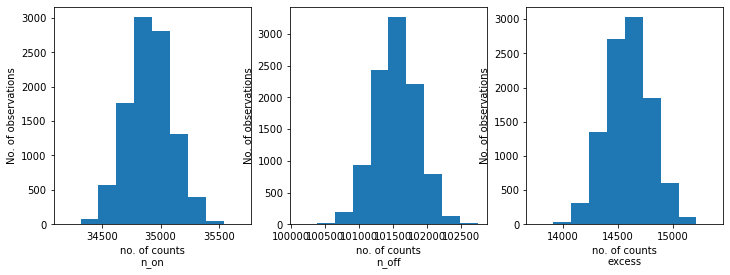

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

CPU times: user 29min 20s, sys: 6.59 s, total: 29min 27s
Wall time: 29min 37s


In [15]:
results

[{'index': 2.2065245213780615,
  'amplitude': 1.314624792989545e-12,
  'lambda_': 0.19822373303885332},
 {'index': 2.2241296518600198,
  'amplitude': 1.2597427958332657e-12,
  'lambda_': 0.19849869006038268},
 {'index': 2.2215816290774106,
  'amplitude': 1.2599389030670734e-12,
  'lambda_': 0.20433315945555797},
 {'index': 2.2255111002319556,
  'amplitude': 1.2639165786699223e-12,
  'lambda_': 0.20108668021471066},
 {'index': 2.2405402452329235,
  'amplitude': 1.2800212266093838e-12,
  'lambda_': 0.1987347318716423},
 {'index': 2.196569540293972,
  'amplitude': 1.3394190116344316e-12,
  'lambda_': 0.22642936450661244},
 {'index': 2.25270088300736,
  'amplitude': 1.218659850841904e-12,
  'lambda_': 0.1711351607368041},
 {'index': 2.2179245864540587,
  'amplitude': 1.3006138000014736e-12,
  'lambda_': 0.20956042677926046},
 {'index': 2.2087873646636726,
  'amplitude': 1.2841801081009587e-12,
  'lambda_': 0.19274956641335284},
 {'index': 2.249279839203157,
  'amplitude': 1.216292553466284

index: 2.2192024959419503 += 0.01547010592747838


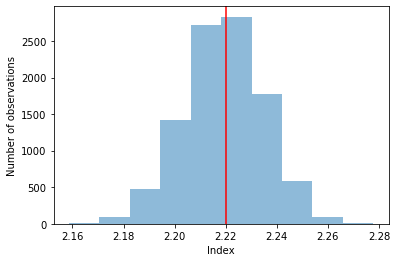

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.2914377649556804e-12 += 3.8088337708317836e-14


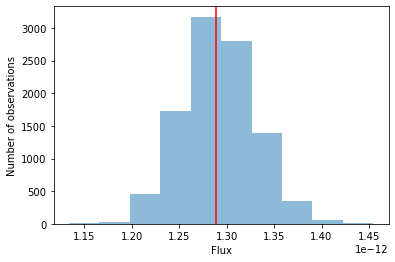

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 0.20099683659178041 += 0.015513810100992415


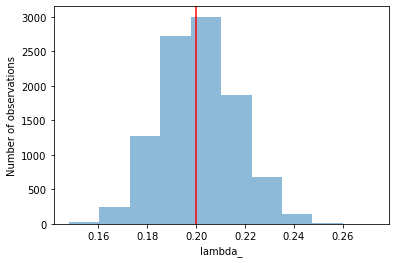

In [18]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")